---

This post is the first in a three part series, which will see us implement the StyleGAN2 architecure at its finale. The Progressive Growing GAN architecture is the foundation of the StyleGAN models, so we start our journey here. You can find the source paper for this post <a href="https://arxiv.org/pdf/1710.10196">here</a>.

---

<h2> The Traditional GAN and its Issues </h2>

The problem with the traditional Goodfellow Generative Adversarial Network, is that it isn't good at generating high resolution images[<sup>1</sup>](#1).

The GAN[<sup>2</sup>](#2) consists of two models, a Generator and a Discriminator. They are pitted against each other in a game, whereby the generator (G model) takes random noise and transforms it into images and the discriminator (D model) checks whether an image is from the generator or the training set of images. The distribution of the generated images should ideally be the same as that of the training images, but such a task is impossible to define by hand. The assessment of the D model provides a gradient[<sup>17</sup>](#17) which can be used to train both the D and G models. Further details can be found from my blog post on the <a href="https://ym2132.github.io/GenerativeAdversarialNetworks_Goodfellow">GAN</a>.

Lets discuss some of the issues this scheme faces. Firstly, the way we assess the performance of the GAN is to check the distance between the training distribution and the generated distribution. However, if these aren't close (i.e. the generated images look nothing like training images and are too easy to tell apart) the gradients can point to random directions. Another issue is the difficulty they face when generating higher resolution images. This comes from the fact that as resolution increases, its much easier to tell the generated images apart from the training images.

This is where the Progressive Growing GAN (PGGAN) makes its key contribution. This is the paper we will be following in this blog post, you can find it at <a href="https://arxiv.org/pdf/1710.10196">https://arxiv.org/pdf/1710.10196</a> By progressively increasing the resolution throughout the model's layers, the PGGAN can generate high quality images which look good.

In terms of metrics, the paper uses a few to test the variance of the generated images (low variance means all generated images will look roughly similar which we don't want). But, for simplicity I will not cover these and we will just assess images by looking at them. 

---

A final caveat, the paper used 1024x1024 images and the model learns to generate images of that size. I will use 256x256 size images in the training set and our model will generate images of that size too, this is to reduce training time and memory usage.

---

Expand this block to show code for imports and some helper functions!

In [42]:
#| code-fold: true

# Before we continue lets set our inputs and configure the device for our model code
import torch
import torchvision

import torch.nn as nn
import torch.nn.functional as F
import torch.nn.init as init

import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torchvision.utils import save_image
from torchvision import datasets, transforms, utils

from torch.utils.data import DataLoader

import matplotlib.pyplot as plt
import numpy as np
from tqdm.notebook import tqdm
from datetime import datetime
import os
from math import sqrt

# We can make use of a GPU if you have one on your computer. This works for Nvidia and M series GPU's
if torch.backends.mps.is_available():
    device = torch.device("mps")
    # These 2 lines assign some data on the memory of the device and output it. The output confirms
    # if we have set the intended device
    x = torch.ones(1, device=device)
    print (x)
elif torch.backends.cuda.is_built():
    device = torch.device("cuda")
    x = torch.ones(1, device=device)
    print (x)
else:
    device = ("cpu")
    x = torch.ones(1, device=device)
    print (x)
    
# I also define a function we use to examine the outputs of the Generator
def show_images(images, num_images=16, figsize=(10,10)):
    # Ensure the input is on CPU
    images = images.cpu().detach()
    
    # Normalize images from [-1, 1] to [0, 1]
    images = (images + 1) / 2
    
    # Clamp values to [0, 1] range
    images = torch.clamp(images, 0, 1)
    
    # Make a grid of images
    grid = torchvision.utils.make_grid(images[:num_images], nrow=4)
    
    # Convert to numpy and transpose
    grid = grid.numpy().transpose((1, 2, 0))
    
    # Display the grid
    plt.figure(figsize=figsize)
    plt.imshow(grid)
    plt.axis('off')
    plt.show()

tensor([1.], device='cuda:0')


<h2>The Progressive Growing GAN</h2>

The key idea is that we can start with low resolution images and grow them by increasing resolution between each layer, we'll cover the mechanics soon. By starting off with low resolution images we allow the network to learn the overall structure of the images and defer the learning of finer details to later stages, this makes the task much simpler than trying to learn both aspects at once.

Let's examine why low resolution images allow the network to learn the main structure of the images. Take Figure 1, a full size 256x256 image and next to it the same image downsized to 4x4 pixels. The PGGAN paper dataset contains pictures of celebrity faces, Figure 1 is one such celebrity and his face.

![Figure 1 - Stringer](./pggan_figures/image_comparison.png)

The 4x4 image contains the complete structural information of the 256x256 image, despite containing 4096 times less information than it. In this example we see, the middle 2x2 area contains the structure of the face, the bottom row has the shoulders and the bearded chin in the middle, the top row has the top of the head and the hair. This happens because images are made up of areas of similar colours, i.e. nearby pixels share similar colours[<sup>3</sup>](#3). This phenomenon of natural images is what allows this architecture to work so well, to drive the point home lets look, in Figure 2, at the full run of images from 8x8 through to 128x128. We see the image structure doesn't change much between each upsizing, this is what we take advantage of in the PGGAN. 

![Figure 2](./pggan_figures/image_size_comparison.png)

<h2>The Path to Implementation</h2>

There are a few crucial ideas which we need to understand to implement the PGGAN. I will name them here and explain them as we go along. We need to understand the growing scheme and the actual structure of the model itself, minibatch standard deviation (MB StdDev), equalised learning rate (Eq LR), pixel normalisation (PN) and the WGAN-GP loss function.

The implementation of these things was not immediately clear to me, to combat this we will take a slight detour for now. The paper itself presents multiple ways to implement the PGGAN, one of which is named the Gulrajani case[<sup>4</sup>](#4). In the Gulrajani case we can skip the implementation of the progressive growing, MB StdDev , Eq LR and PN. Doing so not only makes the task simpler at first but will show us how these other aspects increase the quality of the model. 

---

<b>Note 1:</b> The paper works up to generating 1024x1024 images, for time and compute's sake I will only go up to 256x256. The technique doesn't change if you want toincrease the model capacity to generate the 1024x1024 images quite simply by following the existing structure.

<b>Note 2:</b> Due to the way the Gulrajani case is setup, namely the batch size needs to be alot bigger (the paper states 64, but I use 32 for memory constraints) thus using more memory, so I only generate up to 64x64 images for this case. After we cover this I will implement the full model which will generate 256x256 images.

I admit this may be a bit confusing, but to summarise the plan:

<ul>
    <li> 
        First implement the <b>Gulrajani case</b>, which is the model without any extra bells and whistles. It will generate 64x64 images.
    </li>
    <li>
        Secondly, implement what I call <b>the full case</b>, which is the model with all the extras. It will generate 256x256 images.
    </li>
</ul>

---

So, having said that lets get to it and examine the Generator (G) architecture. In Figure 3 we see the G used by the paper to generate 1024 images. Our implementation uses a truncated version of this but the structure is the same. Also, the number of feature maps we have at each layer differs, this is because we don't start with a (512, 1, 1) shape latent vector. Rather, we start with (128, 1, 1) in the Gulrajani case.

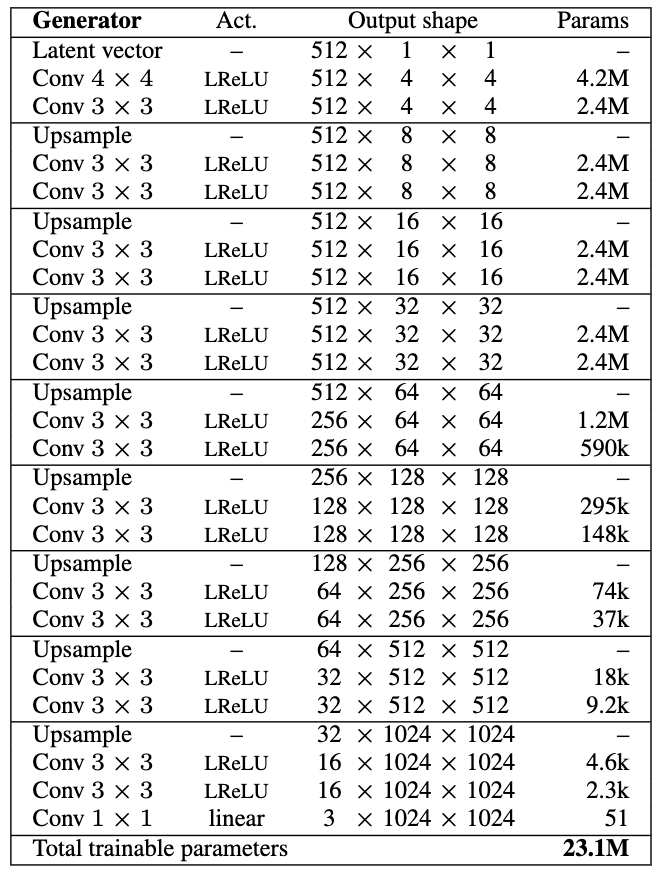

Now, the Gulrajani case has some slight differences to the scheme in Figure 3 and the full case. Here I list out the differences, we will explore and understand them and their implications after implementing the Gulrajani case:
<ul>
    <li> 
        Minibatch size of 32 (paper states 64 but it uses too much memory)
    </li>
    <li>
        LeakyReLU is replaced with standard ReLU.
    </li>
    <li>
        PN is replaced with batch normalisation
    </li>
    <li>
        Disable progressive growing, Mb StdDev and Eq LR
    </li>
    <li>
        The adam optimiser hyperparameters are $\alpha=0.0001$, $\beta=0.9$, in the full case we set $\alpha=0.001$ (it has a higher LR)
    </li>
    <li>
        The model is initialised using He's initialiser.
    </li>
    <li>
        Lastly, in the Gulrajani case the D model is supposed to be updated 5 times for every 1 G update. I scrap this for a 1:1 update ratio. This is for time purposes and I observed better looking photos this way<sup><a href="#5">5</a></sup>.
    </li>
</ul>

Now lets see how we build out the Gulrajani G network!

<h2>The Gulrajani Generator (G) Network</h2>

There are two parts to this, the actual model definiton and the class which creates the blocks. 

Let's look at the model definition first and foremost.

In [2]:
class Gulrajani_Generator(nn.Module):
    def __init__(self, in_c=128):
        super().__init__()
        
        # in_c: In channels, this is the number of channels in the latent vector input
        # We use it to calculate the number of channels in any given layer
        self.in_c = in_c
        
        # For the first block I include the parameter names, they will be exlcuded from subsequent block definitions
        # The first 4x4 block differs in that ksize1 != ksize2, this is to transform the shape of our input from 
        # (batch_size, 128, 1, 1) to (batch_size, 128, 4, 4). I.e. this tranform gives us 4x4 images
        self.block_4x4 = G_ConvBlock(
            in_c=in_c, 
            out_c=in_c, 
            ksize1=4, 
            padding=3, 
            ksize2=3, 
            padding2=1,
            upsample=False
        )
        # As before this block outputs 128 feature maps
        # The first 4 blocks output 128 feature maps, this follows the scheme of the paper
        # The fifth layer is the first layer to halve the number of feature maps, we follow the same scheme
        # with a smaller amout of feature maps
        self.block_8x8 = G_ConvBlock(in_c, in_c, 3, 1)
        self.block_16x16 = G_ConvBlock(in_c, in_c, 3, 1)
        self.block_32x32 = G_ConvBlock(in_c, in_c, 3, 1)
        self.block_64x64 = G_ConvBlock(in_c, in_c//2, 3, 1)
        
        # The to_rgb layer outputs 3 feature maps, i.e. RGB.
        # It has an in_c the same as the out_c of the last (64x64) block
        self.to_rgb = nn.Conv2d(in_c//2, 3, 1)
        
        # We use tanh for the output activation, this bounds our pixels values between [-1,1]
        self.tanh = nn.Tanh()
    
    # To observe the upsampling in effect, uncomment the print statements and run the example output ahead
    # and see what happens! TIP: comment the print statements again before running the training loop ;)
    def forward(self, x):
        # The forward method simply passes x through the layers of our model
        #print(x.shape)
        out_4 = self.block_4x4(x)
        #print(out_4.shape)
        out_8 = self.block_8x8(out_4)
        #print(out_8.shape)
        out_16 = self.block_16x16(out_8) 
        #print(out_16.shape)
        out_32 = self.block_32x32(out_16)
        #print(out_32.shape)
        out_64 = self.block_64x64(out_32)
        #print(out_64.shape)
        
        out = self.to_rgb(out_64)
        #print(out_64.shape)
        out = self.tanh(out)
        
        return out

Now lets look at the code for the G_ConvBlock itself. The reason for the seperation here is mainly to make our code cleaner, by defining the G_ConvBlock class we can save a lot of repeated code[<sup>6</sup>](#6).

In [3]:
class G_ConvBlock(nn.Module):
    def __init__(
        self, 
        in_c, 
        out_c, 
        ksize1, 
        padding,
        ksize2=None, 
        padding2=None,
        stride=None, 
        upsample=True
    ):
        super().__init__()
        
        layers_list = []
        
        # ksize2 and padding2 are used regardless of whether or not they are defined,
        # so if they aren't we set them to ksize1 and padding.
        if ksize2 is None:
            ksize2 = ksize1
        if padding2 is None:
            padding2 = padding
        
        # If upsample True, we add the upsample layer before the
        # next set of convolutional blocks
        if upsample:
            layers_list.extend([
                # Upscale, we use the nearest neighbour upsampling technique
                nn.Upsample(scale_factor=2, mode='nearest'),
            ])
        
        # The layers of the block are the same, regardless of if we use upsample or not
        layers_list.extend([
            nn.Conv2d(in_c, out_c, ksize1, padding=padding),
            nn.BatchNorm2d(out_c),
            nn.ReLU(),
            nn.Conv2d(out_c, out_c, ksize2, padding=padding2),
            nn.BatchNorm2d(out_c),
            nn.ReLU(),
        ])
        
        # We convert out layers_list to a PyTorch Modulelist, this allows us to iterate on the layersb
        self.layers = nn.ModuleList(layers_list)
    
    def forward(self, x):
        for layer in self.layers:
            x = layer(x)
        return x

Having defined our G model, lets run a sample input through the model. Before doing so let's implement a function to intialise the weights of our model. Remember the model needs to be intialised with He's intialisation scheme.

In [4]:
# Initialize with He's initializer
def init_weights(m):
    if isinstance(m, (nn.Conv2d, nn.Linear)):
        nn.init.kaiming_normal_(m.weight, mode='fan_in', nonlinearity='relu')
        if m.bias is not None:
            nn.init.constant_(m.bias, 0)
    # You see nn.LayerNorm here, this will come in handy in the D model
    elif isinstance(m, (nn.BatchNorm2d, nn.LayerNorm)):
        nn.init.constant_(m.weight, 1)
        nn.init.constant_(m.bias, 0)

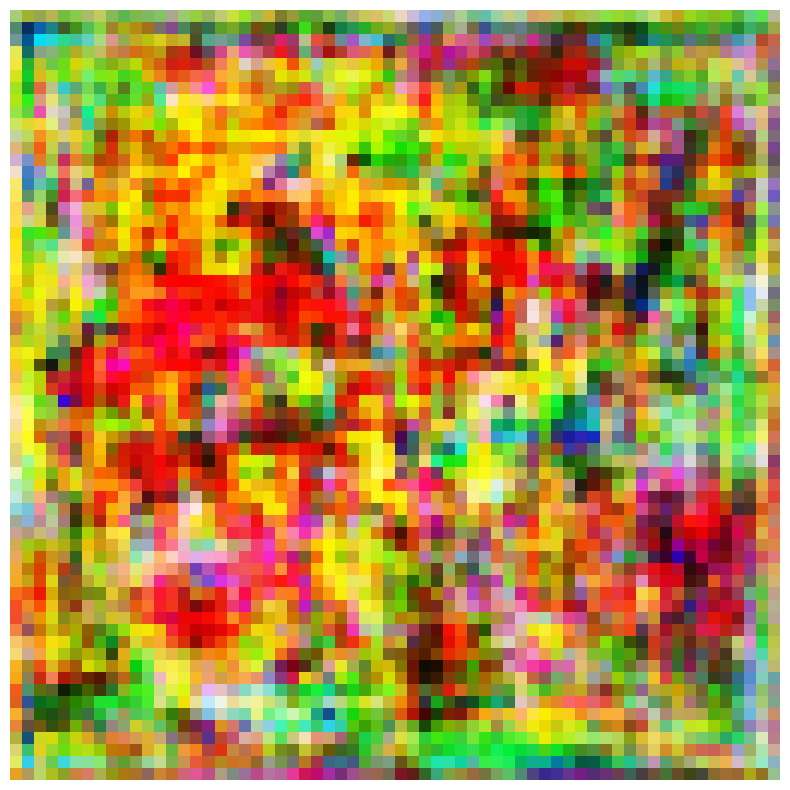

(None, torch.Size([1, 3, 64, 64]))

In [5]:
g = Gulrajani_Generator().to(device)
# Apply the weights intialisation to the model
g.apply(init_weights)

# TESTING G
g_in = torch.randn((1, 128, 1, 1), device=device)
g_out = g(g_in)
show_images(g_out), g_out.shape

Great, we now have our Gulrajani Generator implemented! And it's capable out outputting 64x64. You can experiment with higher resolutions too!

Let's move on to the Discriminator.

<h2>The Gulrajani Discriminator (D) Network</h2>

Looking at Figure 4, we see the architecture for the full case of the D network. Similar to the G network, we will truncate it to match our setup. It's structure is very similar to the G network, just in reverse (in that the first input has the same pixels as the output of the G network). 

The goal of the D network is to classify whether any given image is from the training set or the G model. As such, by examining the output shapes we see it eventually becomes a 1x1x1 shape, this is the final classification of the network. 

So in a line, the D model takes our generated image or a training image as input and outputs a classification of whether it is generated or not. This classification is then used to build our loss functions and update both networks.

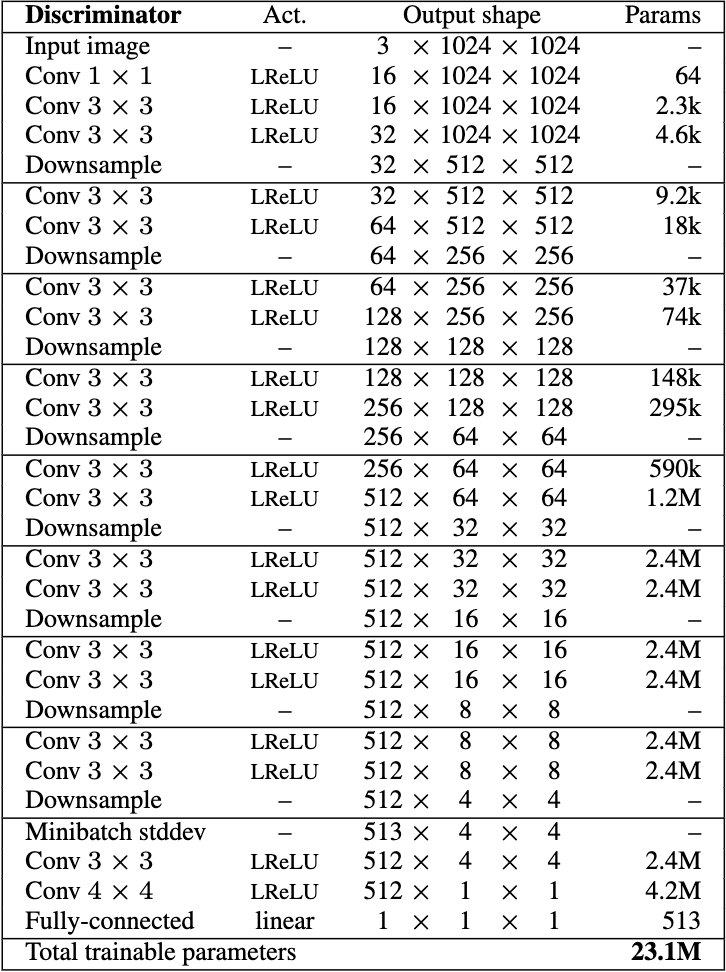

Now, let's build out the Gulrajani D network. Before we start, as before, I list out the specific differences in the Gulrajani D case:

<ul>
    <li> 
        Minibatch size of 32 (paper states 64 but it uses too much memory). Same as the G network.
    </li>
    <li>
        Disable: progressive growing, Mb StdDev and Eq LR. MbStdDev being disabled is noteworthy, in Figure 4 you can see it as a layer before the finals blocks, as such our final blocks have one less feature map than in that image.
    </li>
    <li>
        The adam parameters are the same as for the Gulrajani G model
    </li>
    <li>
        The model is initialised using He's initialiser too.
    </li>
    <li>
        We add layer normalisation after each conv 3x3 and 4x4 layer.
    </li>
</ul>

Having said this, lets get right to the D model code!

In [6]:
class Gulrajani_Discriminator(nn.Module):
    def __init__(self, out_c=128):
        super().__init__()
        
        # Notice the D model is essentially the G in reverse
        # with an added linear layer
        # The first block takes in 64 channels, this is the output
        # from "from_rgb"
        self.block_64x64 = D_ConvBlock(out_c//2, out_c, 3, 1)
        self.block_32x32 = D_ConvBlock(out_c, out_c, 3, 1)
        self.block_16x16 = D_ConvBlock(out_c, out_c, 3, 1)
        self.block_8x8 = D_ConvBlock(out_c, out_c, 3, 1)
        # Our last block differs slightly. The goal is to output
        # 128x1x1 feature maps ready to be passed through the linear layer
        # A note on padding, if padding=0 we do not preserve the dimension through the layer,
        # whereas padding=1 preserves the dimension
        self.block_4x4 = D_ConvBlock(
            in_c=out_c, 
            out_c=out_c, 
            ksize1=3,
            padding=1,
            ksize2=4,
            padding2=0,
        )
        
        self.from_rgb = nn.Conv2d(3, out_c//2, 1)
        
        self.linear = nn.Linear(out_c, 1)
        
    def forward(self, x):
        out = self.from_rgb(x)
        
        # The interpolation has a scale_factor=0.5, this is halving
        # the size of the image each time.
        out = self.block_64x64(out)
        out = F.interpolate(out, scale_factor=0.5, mode='bilinear')
        out = self.block_32x32(out)
        out = F.interpolate(out, scale_factor=0.5, mode='bilinear')
        out = self.block_16x16(out)
        out = F.interpolate(out, scale_factor=0.5, mode='bilinear')
        out = self.block_8x8(out)
        out = F.interpolate(out, scale_factor=0.5, mode='bilinear')
        out = self.block_4x4(out)
        
        # This layer flattens the output of block_4x4, we need to do this as a linear layer
        # expects its input to have only 1 dimension
        out = out.view(out.size(0), -1)
        out = self.linear(out)
        
        return out
        

Before covering the D_ConvBlock, notice the D model is a reverse of the G model. This fact is especially important when we implement progressive growing so keep it in the back of your mind!

Now, lets discuss the D_ConvBlock.

In [7]:
class D_ConvBlock(nn.Module):
    # This block is pretty much the same as the G_ConvBlock, with one small difference
    # See if you can spot the difference and think about why we use this scheme, read ahead for my explanantion
    def __init__(
        self,
        in_c,
        out_c,
        ksize1, 
        padding, 
        ksize2=None, 
        padding2=None,
        stride=None,   
    ):
        super().__init__()
        
        if ksize2 is None:
            ksize2 = ksize1
        if padding2 is None:
            padding2 = padding
            
        layers_list = [
            nn.Conv2d(in_c, out_c, ksize1, padding=padding),
            nn.LeakyReLU(0.2),
            nn.Conv2d(out_c, out_c, ksize2, padding=padding2),
            nn.LeakyReLU(0.2),
        ]
        
        self.layers = nn.ModuleList(layers_list)
    
    def forward(self, x):
        for i, layer in enumerate(self.layers):
            x = layer(x)
            if isinstance(layer, nn.Conv2d):  # After each Conv2d layer
                x = F.layer_norm(x, [x.size(1), x.size(2), x.size(3)])
        #print(x.shape)
        return x

In [8]:
d = Gulrajani_Discriminator().to(device)
# As before we init the model using he's init scheme
d.apply(init_weights)

d_in = torch.randn((1, 3, 64, 64), device=device)
d_out = d(d_in)
d_out, d_out.shape

(tensor([[0.6182]], device='cuda:0', grad_fn=<AddmmBackward0>),
 torch.Size([1, 1]))

Did you spot the difference? More importantly did you figure out why we have this difference? 

If you got it well done! If not let me explain, take a look at our forward pass. The Gulrajani D employs layer normalisation after each convolutional block, but the PyTorch layer_norm has as its parameters the dimensions of the input alongside the input itself. 
To allow for generality we need to dynamically call layer_norm, to ensure it only comes after conv layers we create a layer list and iterate through it. Our instance check ensures the current layer that x has gone through is in fact a conv layer and if so we pass the output through the layer_norm before the LeakyReLU.

So, now we have our Gulrajani G and D setup. Now it's time to generate some images!

<h2>The Training Loop</h2>

We have almost everything we need to get started on training. I say almost, as we don't even have our dataset yet! The dataset we will be using is the CelebA-HQ Face dataset. The original dataset uses 30000 1024x1024 images, however due to its size (80gb on disk) we use a smaller image size. Our dataset is 30000 256x256 images making it easier to handle.

The dataset can be found at: <a href="https://www.kaggle.com/datasets/badasstechie/celebahq-resized-256x256">https://www.kaggle.com/datasets/badasstechie/celebahq-resized-256x256</a>

In [9]:
# Lets set up our data transforms, we don't do anything special here
# We just resize our images to 64x64 and normalise them
# Prepare data loader

transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])

# NOTE: You may need to change the path on your machine
dataset = datasets.ImageFolder('./celeba_hq_256', transform=transform)
# The params, pin_memory speeds up the transfer of data from RAM to GPU VRAM
# and num_workers assigns multiple workers to load data once again speeding up the process
dataloader = DataLoader(dataset, batch_size=32, shuffle=True, pin_memory=True, num_workers=4)

Now that we have the dataset, we can intialise our Adam optimisers and define the training loop[<sup>7</sup>](#7). The loop we define here is pretty standard, however things will get interesting soon when we implement the full case ;)

For training the PGGAN, whether its the full case or the Gulrajani case, we must use the WGAN-GP (Wasserstein GAN - Gradient Penalty) loss function. The reasoning comes from the instability of GAN training, with traditional loss functions training is too difficult. The WGAN-GP loss greatly increases the stability of the training scheme. Let's cover how it works and it's implementation before we develop the full training loop.

### Wasserstein GAN - Gradient Penalty (WGAN-GP)[<sup>4</sup>](#4) 

Long story short, using the WGAN-GP loss improves the training scheme of our GAN and thus improves the quality of the output. 

Now for the long story long, lets discuss how the WGAN-GP loss improves training. Training GANs is inherently difficult due to the setup of the game between the D and G model, at any point in training if the D model becomes too good it will easily tell apart the G samples from real samples. This causes vanishing gradients and the information from D becomes less meaningful, causing a breakdown in the training regime.

#### WGAN

So, in comes the Wasserstein GAN (WGAN - this came before WGAN-GP) whose major contribution was to provide a loss function which improved the stability of GAN training and helped to alleviate mode collapse issues[<sup>8</sup>](#8) (mode collapse is issues such as GANs outputting 1 image for all inputs or images of one colour, so essentially an issue which causes training to fail). How does the WGAN do this (I will do my best to give a quick overview of this[<sup>9</sup>](#9)), well in the traditional GAN setting as the D gets better the loss function becomes saturated and leaves us with those pesky vanishing gradients. The saturation occurs due to the loss functions trying to solve the Jenson-Shannon divergence which is not differentiable everywhere, simply put at some points the gradients provide no information for updating the models. To overcome this it was held that G and D updates need be carefully controlled, such that this behaviour isn't reached, but it is very difficult to do this in practise and there is little common consensus on how to do it well. 

The WGAN uses a Wasserstein distance which is differentiable everywhere meaning the gradients will always be meaningful. Allowing us to train the D model to optimality without worrying about vanishing gradients and preventing mode collapse. Further, we do not have to balance the training of G and D so carefully, as with WGAN the better the D model the more meaningful our gradients are for updating the models. 

So, it sounds like WGAN should work pretty well. Why doesnt it? Let's discuss some it's issues, which will lead us nicely to the WGAN-GP and how it solves these issues. The WGAN requires that the D model satisfies a 1-Lipschitz constraint[<sup>10</sup>](#10), this constrain is enforced by clipping the weights of D. Here's where the issue arises, I quote from the WGAN paper[<sup>8</sup>](#8) "Weight clipping is a clearly terrible way to enforce a Lipschitz constraint". Weight clipping leads to unintended consequences.First, the weight clipping causes the D model to learn very simple functions thus leaving room for improvement given the potential complexity. Second, the weight clipping results in exploding or vanishing gradients, which are exactly what we want to avoid, take. a look at figure 5. The blue line in Figure 5 is WGAN with Gradient Penalty, the solution to these issues. 

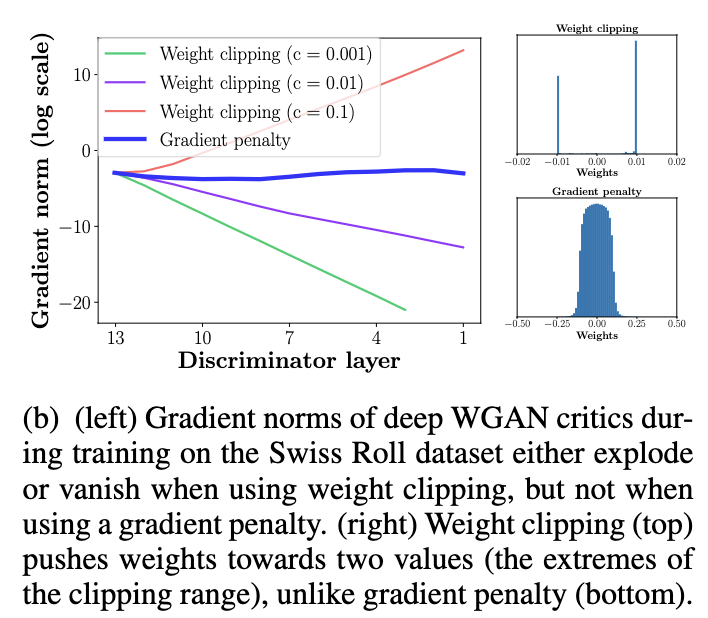

#### WGAN-GP

Having explored WGAN and it's issues, lets shift our attention to WGAN-GP and explore how it improves upon WGAN. The key issues in WGAN arise from enforcing the 1-Lipschitz contstraint through weight clipping, WGAN-GP uses a gradient penalty instead (hence the name). Namely, the 1-Lipschitz constrain is imposed via a penalty on the gradient norm of D. Take a look at Figure 6, this is the formula for our loss function. The "Original critic loss" is the WGAN aspect. $\lambda=10$ is the standard setup. Examine Algorithm 1 which implements this function and let's build it out in Python! (P.S I know Figure 6 may look a little scary, but we will relate the elements of Figure 6 to Algorithm 1 and the Python implementation).

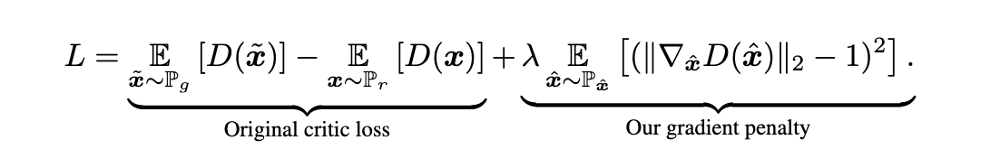

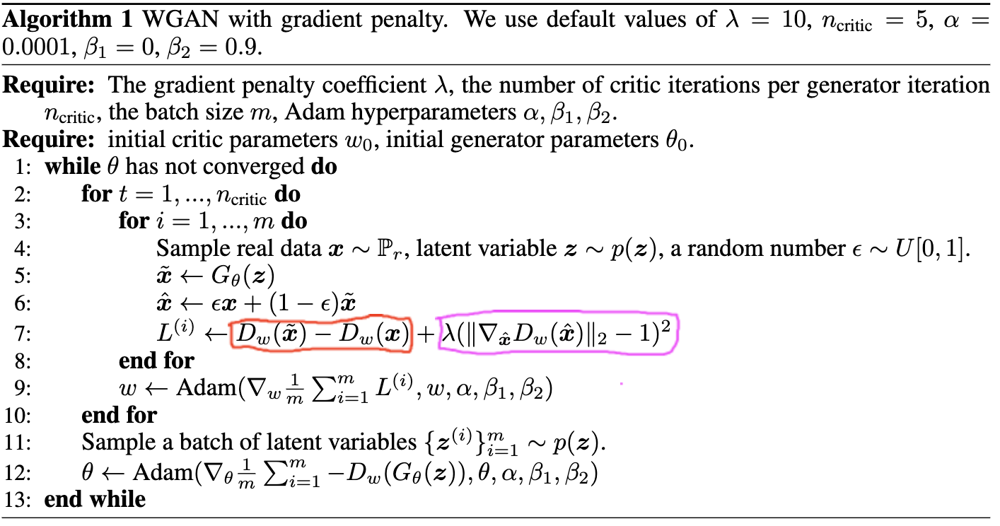

First off, if you take the formula in Figure 6 you see the original critic loss corresponds to the red box in Algo 1 and the gradient penalty corresponds to the purple box. So the WGAN aspect is just the D predictions on $\tilde{x}$, namely the generated images, minus the predictions on $x$, namely the real images. Thus the seemingly scary critic loss is quite simple once broken down!

Now, for the rest of the algorithm I will refer to the following block with the python implementation of the WGAN-GP loss. 

In [ ]:
# NOTE 1 - This block will contain some variable which dont exist yet
# imagine they do, their names should inform you of the content, this
# is just for illustrative purposes
# NOTE 2 - Anytime I refer to a line number I am referring to the line
# number in Algorithm 1. E.g. Line 1 = while theta has not converged do

# We start at line 4, in which we just load our real imgs, create our noise tensor
# and sample epsilon from a uniform distribution
real_imgs, _ = next(iter(dataloader)) 
z = torch.randn((batch_size, latent_dim, 1, 1))
eps = torch. rand((batch_size, 1, 1, 1))  # in the paper eps is a single number, however for us we need multiple due to batch_size > 1
# Line 5 see's us create our generated images
gen_imgs = g(z)  # Assume g is our generator network, we replace x_tilde with gen_imgs

# Lets create our fake and real predictions, these come in handy later
real_preds = d(real_imgs)  # Assume d is the discriminator network
gen_preds = d(gen_imgs)

# Line 6 - we create x_hat
# .detach() moves our images from GPU to CPU (RAM) memory
x_hat = (eps * real_imgs) + ((1-eps) * gen_imgs.detach())  # x_hat is a combination of real and fake imgs
x_hat.requires_grad_(True)  # A PyTorch idiosyncracy to enable backprop on x_hat
pred_x_hat = d(x_hat)  # We use pred_x_hat in calculating the gradient penalty

# Now line 7 is the crux and as such I will split it up into a few different sections
WGAN = gen_preds.mean() - real_preds.mean()  # This is the first part of line 7, D(gen_imgs) - D(real_imgs). As we have a batch size > 1 we must use the mean here
# To calculate the gradient penalty (second part of line 7) we need to take the gradients of D(x_hat)
grads = torch.autograd.grad(
    outputs=pred_x_hat, inputs=x_hat,
    grad_outputs=torch.ones_like(pred_x_hat),
    create_graph=True, retain_graph=True
)[0]  # The grads here represent how the model reacts to an image which is not either real nor fake
# it is in the mid point, and as such it allows us to explore the behaviour of d across the input space
# rather than just when images are real or fake. This allows us to enforce the Lipschitzs constraint by calculating
# the norm of these grads and penalizing it if it is not rougly 1.
GP = ((grads.norm(2, dim=1) - 1) ** 2).mean()  # Now we have our gradient penalty. Once again we use mean due to batch_size

# WGAN_GP_loss = d_loss
d_loss = WGAN + 10 * GP

# The above trains the D model, now lets look at the G model
# The g update is alot simpler, Look at line's 11 and 12
z = torch.randn((batch_size, latent_dim, 1, 1))
gen_imgs = g(z)
gen_preds = d(gen_imgs)  # This corresponds to D(G(z))
g_loss = -gen_preds.mean()  # Remember mean as we have batch_size > 1
# And thats it!

Well done, you've implemented a custom loss function! Now that thats out of the way let's put it use and train our Gulrajani PGGAN.

---

<b>NOTE</b> I train the model here for 10000 iterations (10000 * 32 = 32000 so it's essentially one epoch of the training data). This is a very small amount, and I recommend you train the model for much more iterations (100000 is a good balance of time and output). I used a smaller number to save time and to ensure this post isn't any longer than it already is. 

So, please <b>increase the end_iter</b> before running the following code.

Lastly, you may observe some weird patterns in the Gulrajani case. This is normal and is why this case isn't the end of our story. More on this after we train the model.

---

D: -4.0252, G: 8.4129:   5%|▍         | 499/10000 [02:43<51:19,  3.09it/s]   

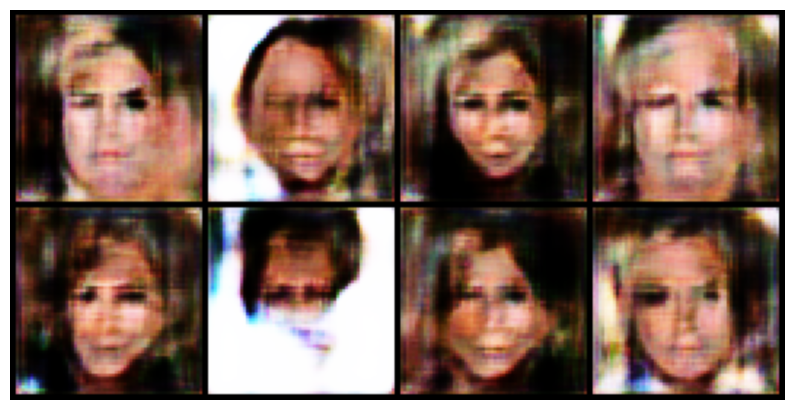

D: 4.1170, G: 2.2822:  10%|▉         | 999/10000 [05:28<49:09,  3.05it/s]    

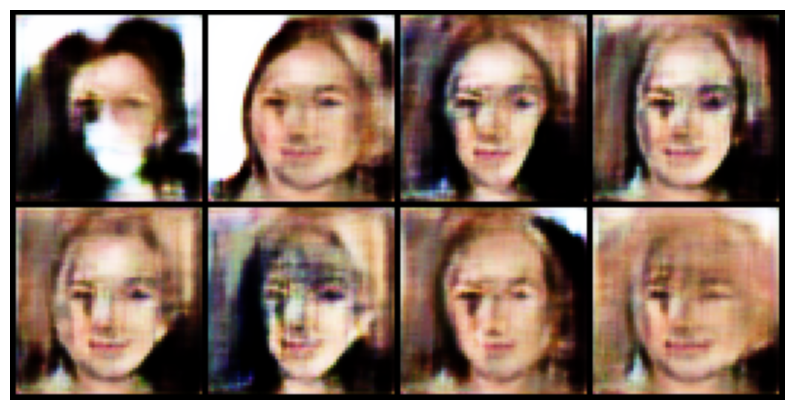

D: -14.0048, G: 13.8735:  15%|█▍        | 1499/10000 [08:14<47:06,  3.01it/s] 

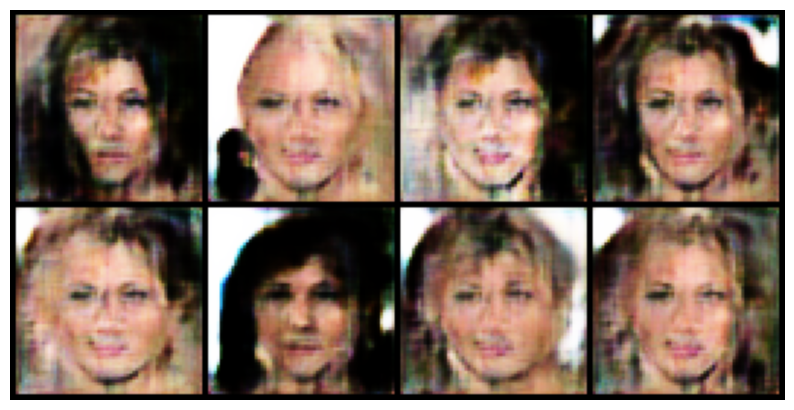

D: -28.7303, G: 20.2716:  20%|█▉        | 1999/10000 [10:59<43:42,  3.05it/s]

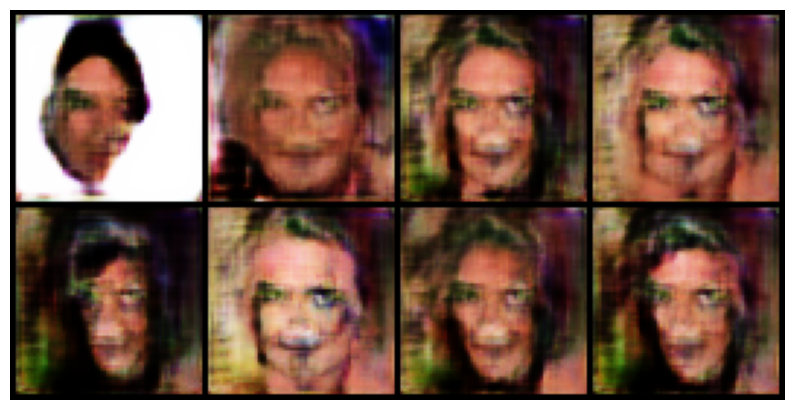

D: -13.0796, G: 23.0539:  25%|██▍       | 2499/10000 [13:43<40:38,  3.08it/s]

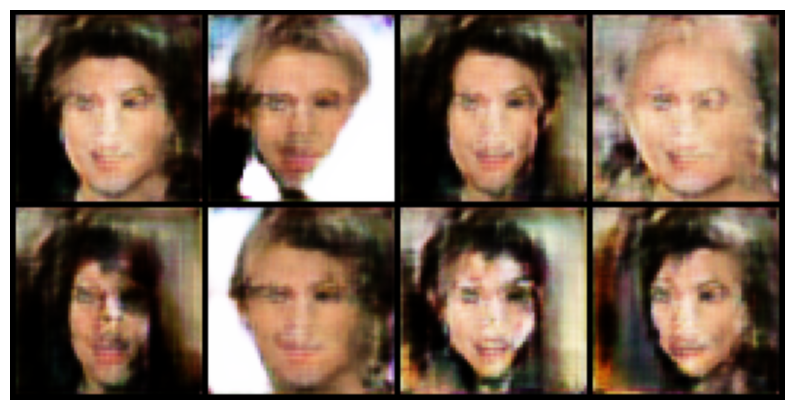

D: -33.7290, G: 26.4978:  30%|██▉       | 2999/10000 [16:29<38:02,  3.07it/s]

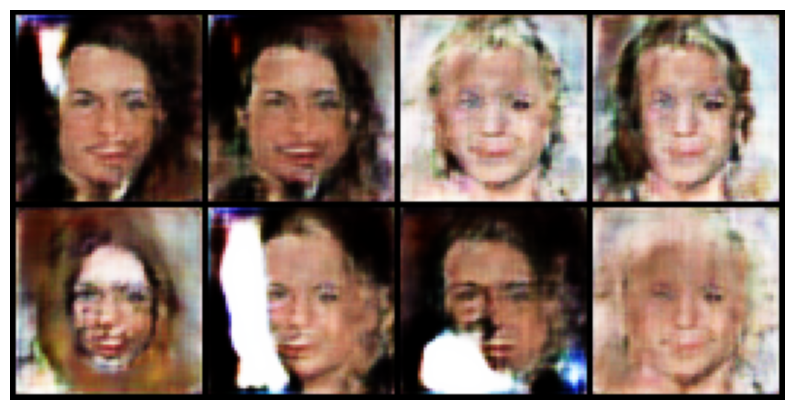

D: -44.3616, G: 29.3735:  35%|███▍      | 3499/10000 [19:15<36:40,  2.95it/s]  

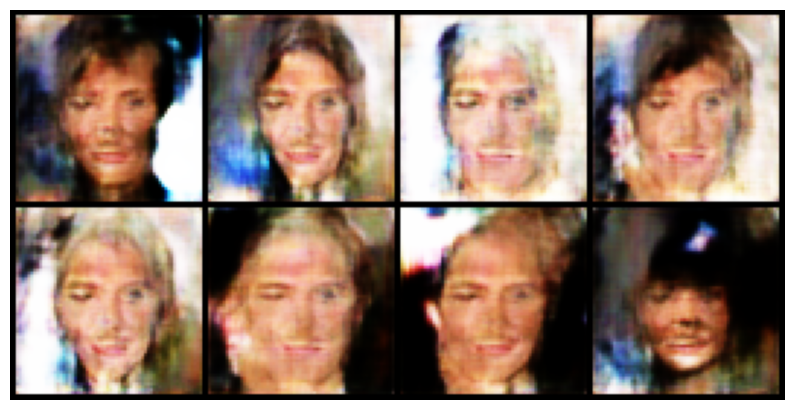

D: -42.4620, G: 31.0859:  40%|███▉      | 3999/10000 [22:01<32:38,  3.06it/s]

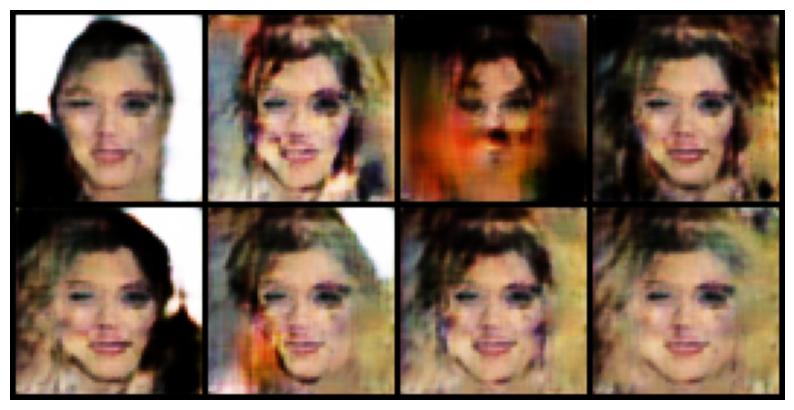

D: -37.8902, G: 30.8805:  45%|████▍     | 4495/10000 [24:45<35:25,  2.59it/s]Traceback (most recent call last):
  File "/home/yusuf/anaconda3/envs/gpu_use/lib/python3.11/multiprocessing/util.py", line 300, in _run_finalizers
    finalizer()
  File "/home/yusuf/anaconda3/envs/gpu_use/lib/python3.11/multiprocessing/util.py", line 224, in __call__
    res = self._callback(*self._args, **self._kwargs)
          ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/yusuf/anaconda3/envs/gpu_use/lib/python3.11/multiprocessing/util.py", line 133, in _remove_temp_dir
    rmtree(tempdir)
  File "/home/yusuf/anaconda3/envs/gpu_use/lib/python3.11/shutil.py", line 738, in rmtree
    onerror(os.rmdir, path, sys.exc_info())
  File "/home/yusuf/anaconda3/envs/gpu_use/lib/python3.11/shutil.py", line 736, in rmtree
    os.rmdir(path, dir_fd=dir_fd)
OSError: [Errno 39] Directory not empty: '/tmp/pymp-i1zs7tv1'
D: -51.7479, G: 33.8998:  45%|████▍     | 4499/10000 [24:46<32:11,  2.85it/s]

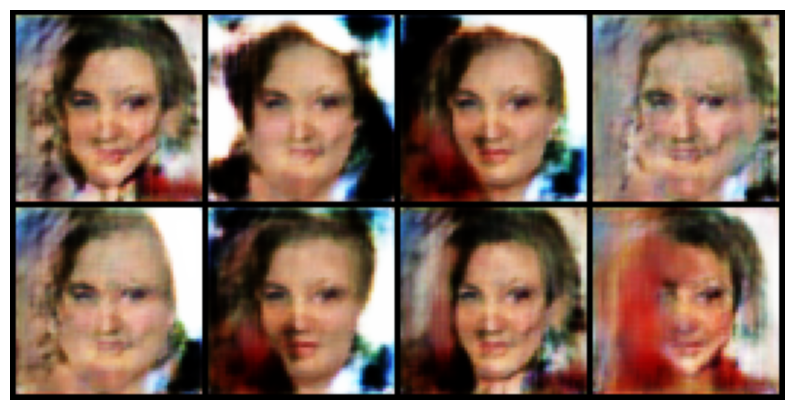

D: -60.7261, G: 38.2137:  50%|████▉     | 4999/10000 [27:32<27:50,  2.99it/s]

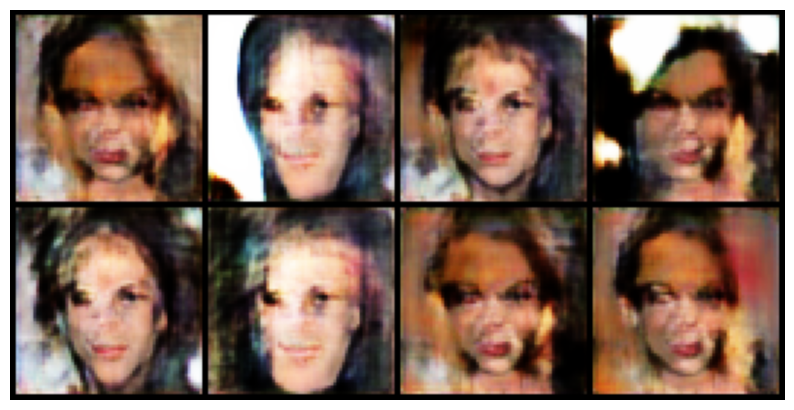

D: -44.3616, G: 8.7010:  55%|█████▍    | 5499/10000 [30:17<24:33,  3.05it/s] 

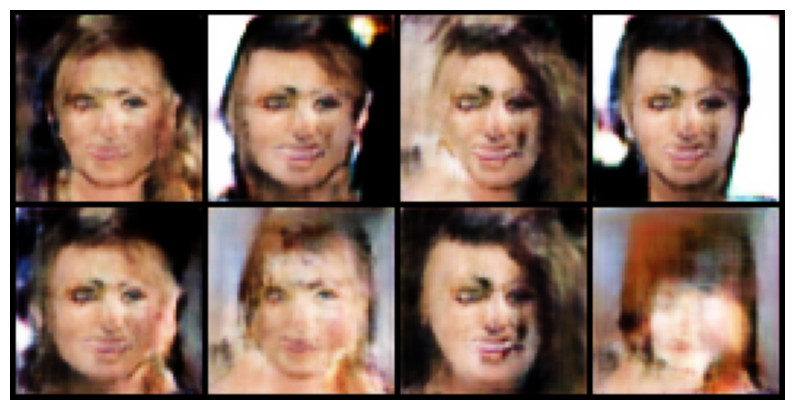

D: -43.4830, G: 28.5494:  57%|█████▋    | 5663/10000 [31:10<24:20,  2.97it/s]Traceback (most recent call last):
  File "/home/yusuf/anaconda3/envs/gpu_use/lib/python3.11/multiprocessing/util.py", line 300, in _run_finalizers
    finalizer()
  File "/home/yusuf/anaconda3/envs/gpu_use/lib/python3.11/multiprocessing/util.py", line 224, in __call__
    res = self._callback(*self._args, **self._kwargs)
          ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/yusuf/anaconda3/envs/gpu_use/lib/python3.11/multiprocessing/util.py", line 133, in _remove_temp_dir
    rmtree(tempdir)
  File "/home/yusuf/anaconda3/envs/gpu_use/lib/python3.11/shutil.py", line 738, in rmtree
    onerror(os.rmdir, path, sys.exc_info())
  File "/home/yusuf/anaconda3/envs/gpu_use/lib/python3.11/shutil.py", line 736, in rmtree
    os.rmdir(path, dir_fd=dir_fd)
OSError: [Errno 39] Directory not empty: '/tmp/pymp-y1hw6u2c'
D: -31.9647, G: 38.9928:  60%|█████▉    | 5999/10000 [33:02<21:44,  3.07it/s]

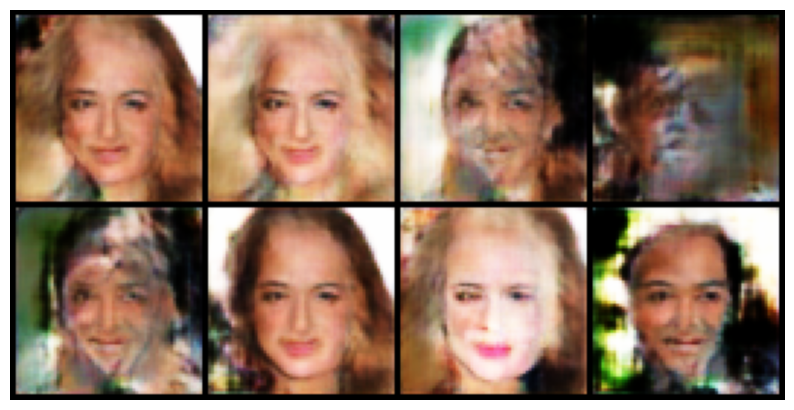

D: -69.3636, G: 46.4498:  65%|██████▍   | 6499/10000 [35:46<19:18,  3.02it/s]

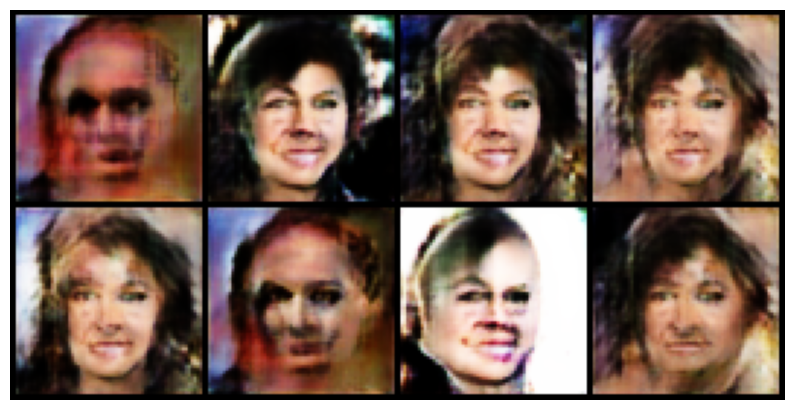

D: -45.6132, G: 42.0237:  70%|██████▉   | 6999/10000 [38:32<16:16,  3.07it/s]

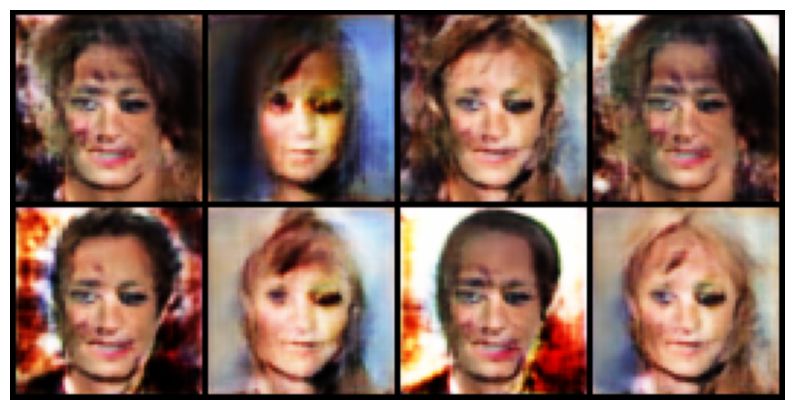

D: -30.6929, G: 32.8052:  75%|███████▍  | 7499/10000 [41:17<13:32,  3.08it/s]

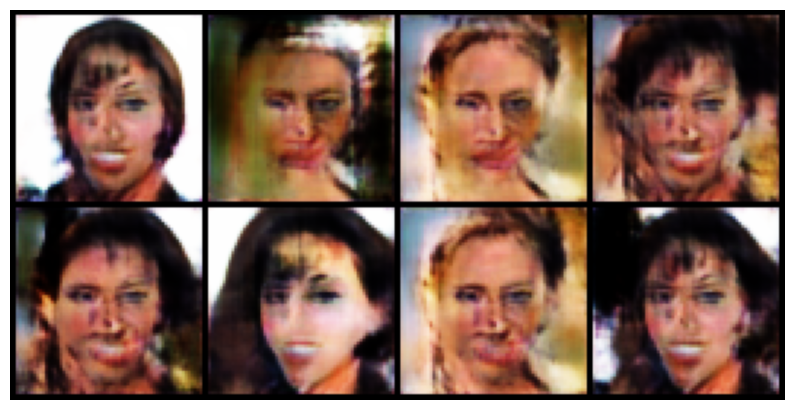

D: -33.7616, G: 49.7827:  80%|███████▉  | 7999/10000 [44:03<13:27,  2.48it/s]

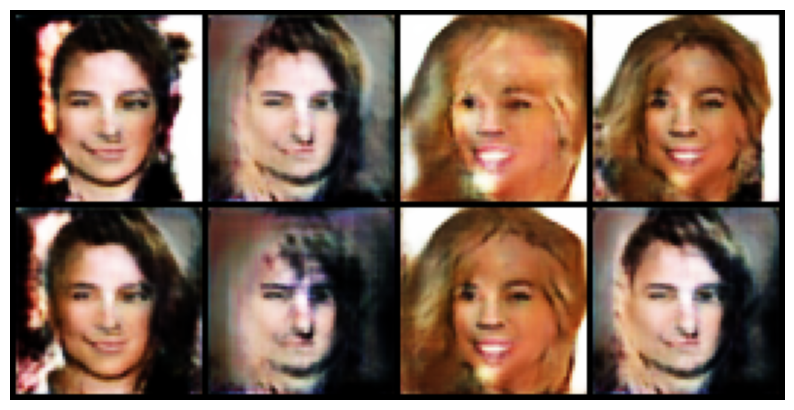

D: 15.4376, G: -27.7988:  85%|████████▍ | 8499/10000 [46:48<08:06,  3.09it/s]

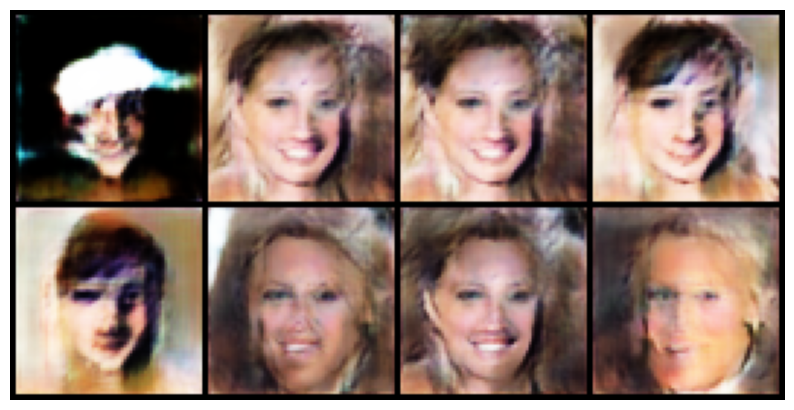

D: -61.9004, G: 8.2054:  90%|████████▉ | 8999/10000 [49:34<05:25,  3.07it/s] 

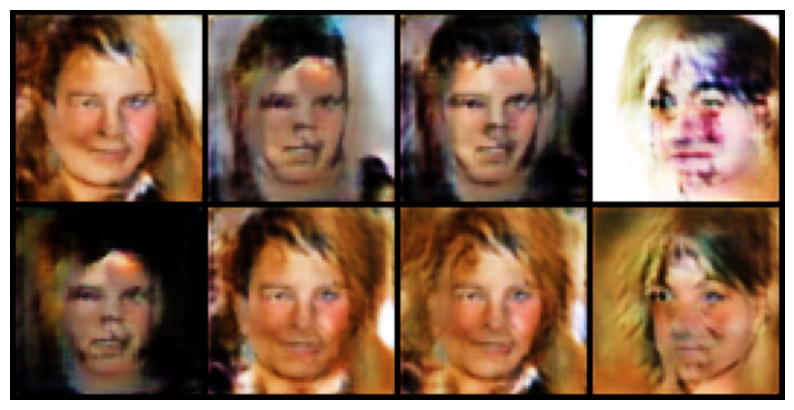

D: -8.8729, G: 32.2779:  95%|█████████▍| 9499/10000 [52:18<02:43,  3.07it/s]  

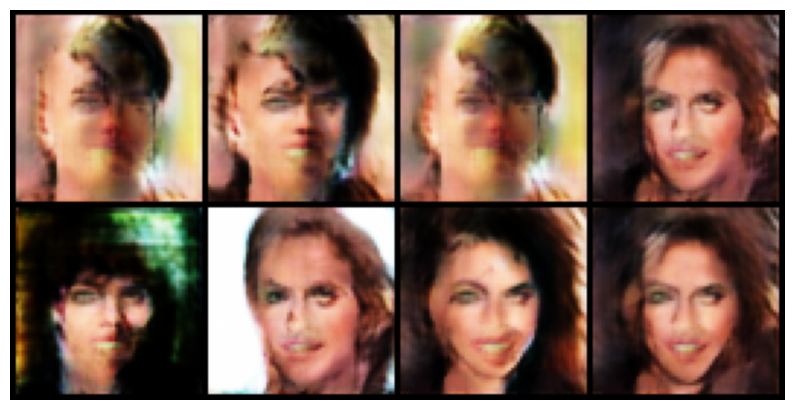

D: -100.8944, G: 60.1621: 100%|█████████▉| 9999/10000 [55:03<00:00,  3.08it/s]

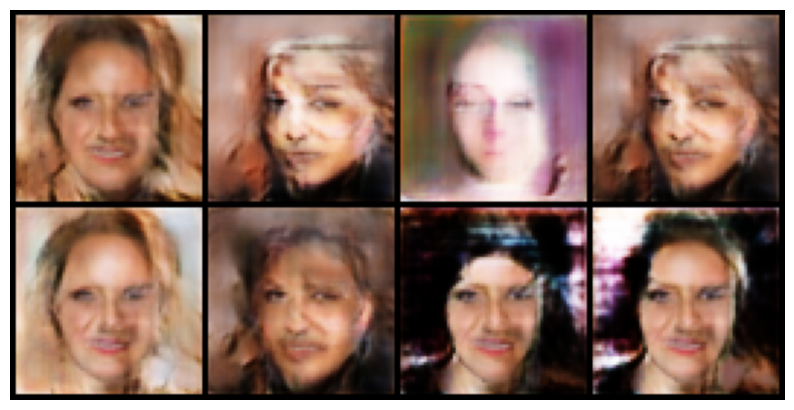

D: -100.8944, G: 60.1621: 100%|██████████| 10000/10000 [55:03<00:00,  3.03it/s]


In [14]:
# In this training loop we will save checkpoints of the model so let's setup a new directory for the checkpoint to be save to.
# Note this code will create the checkpoint dirs in your current working directory (i.e. whichever directory this file is in)
timestamp = datetime.now().strftime("%Y%m%d_%H%M")
checkpoint_dir = os.path.join(os.getcwd(), f"checkpoint_{timestamp}")
os.makedirs(checkpoint_dir, exist_ok=True)

# Lets re-init our models just to ensure there is no carry over from before
d = Gulrajani_Discriminator().to(device)
g = Gulrajani_Generator().to(device)

d.apply(init_weights)
g.apply(init_weights)

# Lets init our optimisers
lr = 0.0001
beta1, beta2 = 0.0, 0.9
batch_size = 32
latent_dim = 128

# Optimizers - Note they are both the same
g_optimizer = torch.optim.Adam(g.parameters(), lr=lr, betas=(beta1, beta2))
d_optimizer = torch.optim.Adam(d.parameters(), lr=lr, betas=(beta1, beta2))

# We will keep track of d_loss and g_loss to examine later
g_losses = []
d_losses = []

# We will use a progress bar to keep track of our training run here
# In order to do this we need a start and an end value
# I deviate from the "epoch" terminology, because in the paper 
# iterations are used to count how much the model is trained rather than epochs.
# The use of iterations highlights the importance of number of images shown, and it also gives finer grained control.
start_iter, end_iter = 0, 10000  # Feel free to increase the end_iter and experiment with your results

# Now lets create a handy progress bar using the tqdm library
progress_bar = tqdm(range(start_iter, end_iter))

# We can use the progress bar to keep track of the number of iterations
for i in progress_bar:
    # First off we train the discriminator
    # A python convention is to use "_" for things we want to throw away or wont use
    # Here _ stores the label which we don't care about as we know implicitly that all real_images have label 1
    d.zero_grad()
    
    real_imgs, _ = next(iter(dataloader))
    real_imgs = real_imgs.to(device)
    real_preds = d(real_imgs)
    
    # Gen fake images
    z = torch.randn((batch_size, latent_dim, 1, 1)).to(device)
    gen_imgs = g(z)
    gen_preds = d(gen_imgs.detach())
    
    # Gradient Penalty - GP
    eps = torch.rand((batch_size, 1, 1, 1)).to(device)
    x_hat = (eps * real_imgs) + ((1-eps) * gen_imgs.detach())
    x_hat.requires_grad_(True)
    pred_x_hat = d(x_hat)
    
    WGAN = gen_preds.mean() - real_preds.mean()
    grads = torch.autograd.grad(
        outputs=pred_x_hat, inputs=x_hat,
        grad_outputs=torch.ones_like(pred_x_hat),
        create_graph=True, retain_graph=True
    )[0]
    GP = ((grads.norm(2, dim=1) - 1) ** 2).mean() 
    
    # WGAN_GP_loss = d_loss
    d_loss = WGAN + 10 * GP
    d_loss.backward()
    d_optimizer.step()
    
    d_losses.append(d_loss.detach())
    
    # Now lets train the Generator
    g.zero_grad()
    z = torch.randn((batch_size, latent_dim, 1, 1)).to(device)
    gen_imgs = g(z)
    gen_preds = d(gen_imgs)
    g_loss = -gen_preds.mean()
    g_loss.backward()
    g_optimizer.step()
    
    g_losses.append(g_loss.detach())
    
    # Now lets setup some testing stuff to keep us informed on how the model is doing.
    # This consists of outputting sample images from the G model at regular intervals(I choose every 500 iterations)
    # and saving some model checkpoint throughout training (I save a checkpoint every 10000 iterations).
    # We also want to update our status bar with some useful info, such as the current loss values. We do 
    # this every 100 iterations
    if (i + 1) % 100 == 0:
        progress_bar.set_description(f"D: {d_loss.item():.4f}, G: {g_loss.item():.4f}")
        
    if (i+1) % 500 == 0:
        # Lets show some samples
        with torch.no_grad():
            # We gen 8 sample images
            sample_z = torch.randn(8, latent_dim, 1, 1).to(device)
            sample_imgs = g(sample_z)
            show_images(sample_imgs)
            
    if (i+1) % 10000 == 0:
        torch.save({
            'g_state_dict': g.state_dict(),
            'd_state_dict': d.state_dict(),
            'g_optimizer_state_dict': g_optimizer.state_dict(),
            'd_optimizer_state_dict': d_optimizer.state_dict(),
            'iteration': i
        }, f'{checkpoint_dir}/checkpoint_iter_{i+1}.pth')

#### The Gulrajani Case - Postmortem

The images above may differ from your own, but the network is generating faces (with very clear issues). The model seems to struggle on generating backgrounds and facial features all look messed up, but they do look like faces! Upon closer examination of loss values, we see something is going wrong. 

The actual loss values of G and D vary massively, this is not what we want to see. This highlights the inherant unstability of GANs and despite our WGAN-GP we still see this behaviour in the Gulrajani case. This instability can be tamed by Equalised Learning Rate and Pixel Normalisation. We will cover both of these and apply them to the full case and observe the impact.

Next, notice lack of diversity in the generated images. Often times in the samples shown, mutliple images seem to look pretty similar with minor differences. Why could this be happening? A well known issue with GANs is failure to capture the all the variation in the dataset, in the PGGAN paper this is solved by the Minibatch Standard Deviation layer. 

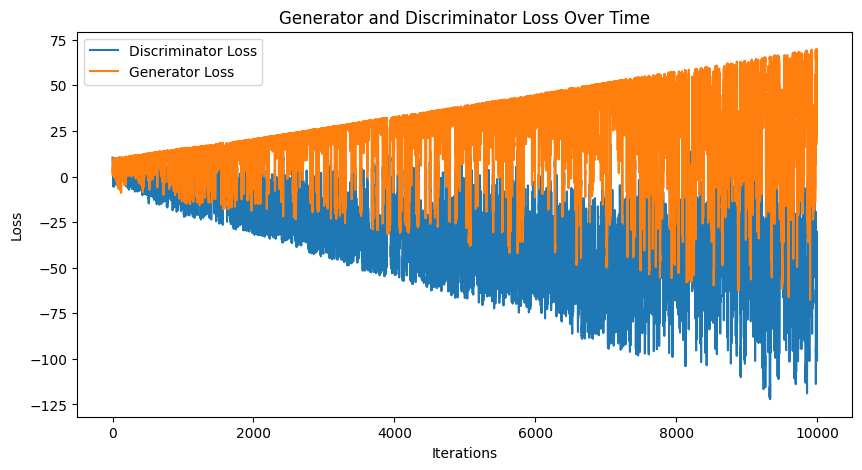

In [25]:
# Assuming d_losses and g_losses are lists of GPU tensors
d_losses_cpu = [loss.cpu().detach().numpy() for loss in d_losses]
g_losses_cpu = [loss.cpu().detach().numpy() for loss in g_losses]

plt.figure(figsize=(10, 5))
plt.plot(d_losses_cpu, label='Discriminator Loss')
plt.plot(g_losses_cpu, label='Generator Loss')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.legend()
plt.title('Generator and Discriminator Loss Over Time')
plt.show()

Above you see a plot of the G and D loss over the iterations, it's clear there's a huge issue here. This shows clearly how difficult it is to train GANs. As the model get's larger it appears the stability of the training process decreases, as is the difficulty of generating high resolution images. My intuitions tells me that this is what the full case will solve, by learning the lower level representations. 

I want to take a moment to discuss the WGAN-GP and what the value ranges mean. We want the loss to be close to 0. 
For the D model:
- A large positive value means it is getting the classifications wrong or G is making very good gen images. 
 - A near 0 value means the D is about 50/50 at telling real from gen images, this is where you want to be. 
 - A large negative value means D is very good at distuingishing fakes, and isn't providing good information anymore.

For the G model:
 - A large positive value means G is making bad gen images and they are easy to distuingish from the real images.
 - A value near 0 means G is producing good gen images.
 - A large negative loss isn't something that happens and if it does, something is going wrong. Check your outputs, perhaps the model is exhbiting mode collapse.

<h1>The Full Case Progressive GAN</h1>

Finally, we are ready to implement the full PGGAN!!! All that came before was leading to this. Here's a short roadmap in the order we will cover things: PixelNorm (PN, MiniBatchStdDev, Equalised Learning Rate (EqLR) layers, the new ConvBlocks (slightly different but not by much), the new G and D networks setups (exhibit a stark difference with the implementation of progressive growing, mainly in the forward methods) and finally the training loop.

Note, we will see the Progressive Growing aspect in the model definitions.

Without further ado, lets get to it!

### PixelWise Normalisation (PN)

Typically GANs use batch normalisation (BN) in the G and D to help stabilise training, however WGAN-GP fares poorly with BN in the D so our model does not use any normalisation in the D model[<sup>11</sup>](#11). In the PGGAN we ditch BN in favour of PN and apply it to the layers in the G. The formula for for PN is given in Figure 7. This formula is a variant of Local Response Normlization from the ImageNet paper by Krizhevsky et al. In this formula: 

$\epsilon=10^{-8}$

$N=\text{number of feature maps}$

$a_{x,y}=\text{The input}$

$b_{x,y}=\text{The output, i.e. the normalised input}$

Let's implement it!


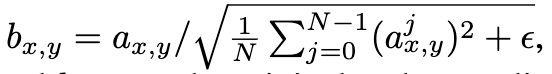

In [8]:
# I choose to implement this as a PyTorch module
# In PyTorch you have a lot of freedom to create modules for many tasks
class PixelNorm(nn.Module):
    def __init__(self):
        super().__init__()
    
    # You see it's a relatively straightforward implementation
    # the term inside the sqrt is a summation over all feature maps
    # divided by all feature maps, a.k.a taking the mean!
    def forward(self, x):
        return x / torch.sqrt(torch.mean(x ** 2, dim=1, keepdim=True)
                                  + 1e-8)

### Minibatch Standard Devation - MbStdDev

GANs tend to capture only small parts of the variation of the training data, we saw this firsthand in the Gulrajani case where our outputs were often very similar. One of the reasons this can happen is that the G learns to produce a limited set of outputs (reaches a local minima in the gradient space) and then the D model gets good at classifying these as real and treats everything else as generated pushing the G further to generate those same outputs which fool the D. To solve this, the PGGAN paper introduces MbStdDev. The formulation is as follows: 
    
    1 - Compute standard deviation for each feature map, in each spatial location (i.e. height and width) over the batch
    2 - Average the output of 1 over all feature maps and spatial locations to get a single value
    3 - Then create another feature map with this single value repeated throughout it, this is then concatenated to the original feature maps.

The idea behind this is that it allows the D model to consider the whole batch at the same time, by providing information on the variance of the batch of generated samples the D can punish batches with low std dev. The training data will likely have a high std dev, due to the difference in real images, this is why the D model will punish low std dev inputs. Keep in mind this depends alot upon the real images, if they were to have a low std dev too I'm not sure how effective this technique would be. In short, the goal is to provide D with information on std dev of entire batches and get the G to generate images with similar std dev to the real images.

Now let's implement it!
    
---

Note, for the implementation of this I refer to the paper authors github repo for the code. They apply some tricks, which aren't discussed in the paper which stumped me until I looked at their code. For what it's worth, this is a common thing when implementing papers and you often need to think a little out of the box when translating the paper to code to get it to work[<sup>12</sup>](#12).

---

In [9]:
# Once again we implement Md StdDev as a PyTorch module
class MiniBatchStdDev(nn.Module):
    def __init__(self, group_size=4):
        super().__init__()
        # Group size is from the github repo I linked to
        # It isn't discussed at all in the paper AFAIK
        self.group_size = group_size
    
    def forward(self, x):
        N, C, H, W = x.shape  # N = num feature maps, C = num channels, H = height, W = width
        G = min(self.group_size, N)  # the minibatch must be divisible by group_size
        
        # Here we split up X into groups
        # This line may be a little weird, expand the next code box to explore this line!
        y = x.view(G, -1, C, H, W)
        
        # The 3 following lines see us implement number 1 from the list above.
        y = y - torch.mean(y, dim=0, keepdim=True)
        y = torch.mean(torch.square(y), dim=0)
        y = torch.sqrt(y + 1e-8)
        
        # This is number 2
        y = torch.mean(y, dim=[1,2,3], keepdim=True)
        
        # Finally this is number 3
        y = y.repeat(G, 1, H, W)
        
        # We return the input x with an additional feature map
        return torch.cat([x,y], dim=1)

Expand this code block to explore 

In [10]:
#| code-fold: True

# In line 15 we have y = x.view(G, -1, C, H, W)
# Let's explore what this code
b = torch.randn((32, 128, 32, 32))  # Assume b is our tensor in the D network
# in the view 4 corresponds to the group size, -1 in a dims mean PyTorch will calculate it for us
# 128 is the number of channels and the last 2 are height and width
c = b.view(4, -1, 128, 32, 32)
# So let's take a look at how the .view changes b
print(b.shape, c.shape)
# We see the C, H and W columns don't change
# The change come's from the N column. We have split out our 32 feature maps
# into 4 groups of 8. I may be wrong here but I think this allows us to better
# capture the variation in subsets of the images. Honestly, I'm not
# sure why this is done so feel free to email me and we can discuss further

torch.Size([32, 128, 32, 32]) torch.Size([4, 8, 128, 32, 32])


### Equalised Learning Rate - EqLR

Now time for the big one, Eq LR stumped me for the longest time on this implementation. I must give credit to <a href="https://github.com/odegeasslbc/Progressive-GAN-pytorch/blob/master/progan_modules.py">https://github.com/odegeasslbc/Progressive-GAN-pytorch/blob/master/progan_modules.py</a>, who's implementation I made use of. The PyTorch wizadry to make this work is a bit beyond me at the moment, so I will use their implementation and do my best to explain it[<sup>13</sup>](#13).

The name was slightly misleading to me, as the technique refers to scaling of the weights of the layers at runtime rather than acting on the learning rate itself. 

The paper states that the weights are scaled to $\hat{w}_i=\frac{w_i}{c}$ where $w_i=\text{weights}$ and $c$ is the per-layer normalisation constant from He's intialiser. But in the code they provide (and my implementation) the weights are scaled by $w_i=w_i * \frac{\sqrt{2}}{c}$. I am not sure why the scaling is different, perhaps this way just works better? If you know please let me know.

He's intialiser is a common weight initialisation method for all form of neural networks (we used it previosuly to init our Gulrajani case).

Eq LR is a method of normalisation, employed in both the G and D models. Normalisation is necessary in the PGGAN to constrain the signal magnitdues, i.e. to ensure we dont see exploding or vanishing gradients. Eq LR, comes in to use due to a particular of the optimisers used in neural network trainig (Adam, RMSProp etc). These optimisers normalise a gradient update by its estimated std dev, so the update is independent of the scale of the parameter.

So if some parameters have a larger dynamic range than others they will take longer to adjust, Eq LR ensures this doesn't happen as it makes the dynamic range and learning speed of all weights the same. A dynamic range is the range of values that the weights can take, by constraining them we ensure this range isn't too large or too small[<sup>14</sup>](#14).

Let's implement it shall we.

In [11]:
# This is the key class
# It applies EqLR not just at intialisation but dynamically throughout training
# This is done through a forward pre-hook, which essentially is a function
# which runs before the forward method
class EqualLR:
    # We init the EqualLR class with the name of the weight parameter
    def __init__(self, name):
        self.name = name
    
    def compute_weight(self, module):
        # getattr = get attribute, in weight we stored the original
        # in the apply method
        weight = getattr(module, self.name + '_orig')
        # weight.data.size(1) is the number of channels (for a conv layer)
        # or the number of input features (for a linear layer)
        # weight.data[0][0].numel() for a linear layer is 1 and for a conv layer
        # it is the kernel size*kernel_size.  
        fan_in = weight.data.size(1) * weight.data[0][0].numel()

        return weight * sqrt(2 / (fan_in))

    @staticmethod
    def apply(module, name):
        # We create an instance of EqualLR 
        fn = EqualLR(name)
        
        # The original weight is retrived from the layer
        weight = getattr(module, name)
        # The weight is deleted from the layer
        del module._parameters[name]
        # We register a new parameter with the name _orig
        # saving the original parameters
        module.register_parameter(name + '_orig', nn.Parameter(weight.data))
        # We call the pre-hook, which runs before the forward pass
        module.register_forward_pre_hook(fn)

        return fn

    def __call__(self, module, input):
        # We call compute weight before the forward pass
        # When registering the pre_hook this __call__ is what will be called
        weight = self.compute_weight(module)
        setattr(module, self.name, weight)


def equal_lr(module, name='weight'):
    # This is just a simple function to apply the EqualLR regime
    EqualLR.apply(module, name)

    return module

# We redefine the layers simply, initialising the weight with a normal 
# distribution and the biases as 0. 
# By using  *args and **kwargs we allow for full flexibility in these layers
# and we can pass the usual arguments we would to the regular PyTorch versions.
class EqualLRConv2d(nn.Module):
    def __init__(self, *args, **kwargs):
        super().__init__()

        conv = nn.Conv2d(*args, **kwargs)
        conv.weight.data.normal_()
        conv.bias.data.zero_()

        self.conv = equal_lr(conv)

    def forward(self, input):
        return self.conv(input)


class EqualLRConvTranspose2d(nn.Module):
    def __init__(self, *args, **kwargs):
        super().__init__()

        conv = nn.ConvTranspose2d(*args, **kwargs)
        conv.weight.data.normal_()
        conv.bias.data.zero_()

        self.conv = equal_lr(conv)

    def forward(self, input):
        return self.conv(input)

class EqualLRLinear(nn.Module):
    def __init__(self, in_dim, out_dim):
        super().__init__()

        linear = nn.Linear(in_dim, out_dim)
        linear.weight.data.normal_()
        linear.bias.data.zero_()

        self.linear = equal_lr(linear)

    def forward(self, input):
        return self.linear(input)
    

Now, with those tools ready to use we can begin building the final block. It's time to build the models themselves and implement the full progressive growing.

---

A word to the wise, the code for EqualLR is not straightforward. If you do not understand it (as I didn't) then don't be afraid to move on and come back to it :)

---

<h2> The Full Case G and D Networks </h2>

---

From here on out the <b>Full Case G and D networks will be referred to as just G and D</b> respectively

---

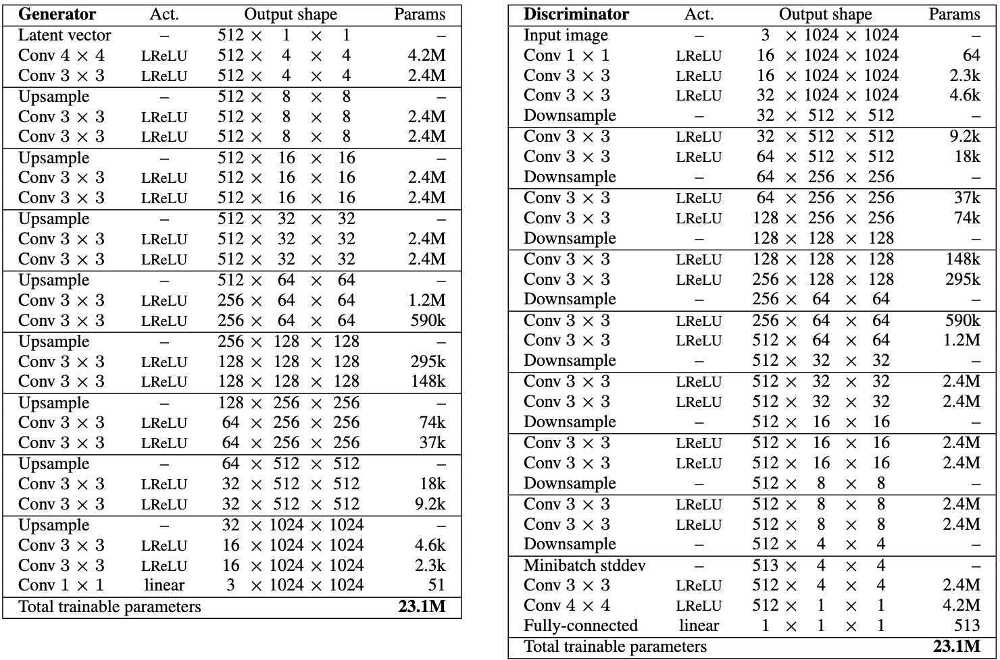

In Figure 7 you see the full architecture of the G and D models. The ones shown generate 1024x1024 images, as above for compute and time constraints, we will use 256x256 images instead. It is more than the 64x64 we generated in the Guljarani case, this is due to the progressive growing increasing our training efficiency. Then, our G model will start off with a latent of shape (batch_size, 256, 1, 1) and output of size (batch_size, 3, 256, 256) and the D model will take input of size (batch_size, 3, 256, 256) and output of size (1) (the last 2 dims change depending on which layer we are at). 

Our model's follow the same pattern as above. For example, in our G we will see the first 4 layers will keep the number of channels the same and subsequently we begin to halve the number of channels. Similarily, in our D model we have the same number of channels in the last 4 layers, and they get progressively smaller as you move back to the first layer. This layout follows the paper, just with less channels and layers overall (feel free to experiment with different schemes here, e.g. progressively growing channels by 4x each time instead of 2x).

As before, I'll cover the networks themselves first and then the convolutional blocks that make them up.

<h4> The Full Case G </h4>

Let's jump right into the code, then we can explore what exactly is going on!

In [15]:
# Credit to: https://github.com/odegeasslbc/Progressive-GAN-pytorch/blob/master/progan_modules.py

class Generator(nn.Module):
    def __init__(self, in_c=256):
        super().__init__()
        # The init method of G resembles the Gulrajani
        # The major difference is the addition of multiple to_rgb layers
        # This is to facilitate the growing
        
        self.in_c = in_c
        
        self.block_4x4 = G_ConvBlock(in_c, in_c, 4, 3, 3, 1, upsample=False)
        self.block_8x8 = G_ConvBlock(in_c, in_c, 3, 1)
        self.block_16x16 = G_ConvBlock(in_c, in_c, 3, 1)
        self.block_32x32 = G_ConvBlock(in_c, in_c, 3, 1)
        self.block_64x64 = G_ConvBlock(in_c, in_c//2, 3, 1)
        self.block_128x128 = G_ConvBlock(in_c//2, in_c//4, 3, 1)
        self.block_256x256 = G_ConvBlock(in_c//4, in_c//4, 3, 1)
        
        # no LeakyReLU on the to_RGBs
        self.to_rgb_4 = EqualLRConv2d(in_c, 3, 1)
        self.to_rgb_8 = EqualLRConv2d(in_c, 3, 1)
        self.to_rgb_16 = EqualLRConv2d(in_c, 3, 1)
        self.to_rgb_32 = EqualLRConv2d(in_c, 3, 1)
        self.to_rgb_64 = EqualLRConv2d(in_c//2, 3, 1)
        self.to_rgb_128 = EqualLRConv2d(in_c//4, 3, 1)
        self.to_rgb_256 = EqualLRConv2d(in_c//4, 3, 1)
                
        self.tanh = nn.Tanh()

    def forward(self, x, layer_num, alpha):  
        # Our forward method now takes some new parameters
        # layer_num corresponds to the current layer we are on
        # alpha is the value of the parameter alpha used in the introduction of 
        # new layers to the network
        
        # The first layer is simple, we just pass it through the 4x4 block 
        # and if we are currently on layer_1 we pass it through to_rgb and call it a day
        out_4 = self.block_4x4(x)
        if layer_num == 1:
            out = self.to_rgb_4(out_4)
            out = self.tanh(out)
            return out
        
        # The second layer and onwards are where things heat u
        # Being the second layer we have a previous layer available and it must be used in our progressive growing
        # We pass the out_4 through out_8 
        out_8 = self.block_8x8(out_4)
        if layer_num == 2:
            # if we are currently introducing layer 2 we must implement out formula from below
            # skip corresponds to skip in the formula, as seen in Figure 8 we operate on the outputs
            # passed through to_rgb layers
            skip = self.to_rgb_4(out_4)
            # skip is currently 4x4 images, for the formula to work dimensions must match
            # so we upsample skip to beome 8x8 images, matching the dimensions of out_8 
            skip = F.interpolate(skip, scale_factor=2, mode='bilinear')
            # We also pass out_8 through to_rgb
            out = self.to_rgb_8(out_8)
            
            # Here is our formula, note here I use one out
            # "out = " this one is the out and "* out" is the out_new
            out = ((1-alpha) * skip) + (alpha * out)
            # Our outputs are passed through a tanh, this is to put the values in the range [-1,1]
            out = self.tanh(out)
            return self.tanh(out)
        
        # This scheme continues for all subsequent layers
        out_16 = self.block_16x16(out_8)
        if layer_num == 3:
            skip = self.to_rgb_8(out_8)
            skip = F.interpolate(skip, scale_factor=2, mode='bilinear')
            out = self.to_rgb_16(out_16)
            
            out = ((1-alpha) * skip) + (alpha * out)
            out = self.tanh(out)
            return out
        
        out_32 = self.block_32x32(out_16)
        if layer_num == 4:
            skip = self.to_rgb_16(out_16)
            skip = F.interpolate(skip, scale_factor=2, mode='bilinear')
            out = self.to_rgb_32(out_32)
            
            out = ((1-alpha) * skip) + (alpha * out)
            out = self.tanh(out)
            return out
        
        out_64 = self.block_64x64(out_32)
        if layer_num == 5:
            skip = self.to_rgb_32(out_32)
            skip = F.interpolate(skip, scale_factor=2, mode='bilinear')
            out = self.to_rgb_64(out_64)
            
            out = ((1-alpha) * skip) + (alpha * out)
            out = self.tanh(out)
            return out
        
        out_128 = self.block_128x128(out_64)
        if layer_num == 6:
            skip = self.to_rgb_64(out_64)
            skip = F.interpolate(skip, scale_factor=2, mode='bilinear')
            out = self.to_rgb_128(out_128)
            
            out = ((1-alpha) * skip) + (alpha * out)
            out = self.tanh(out)
            return out
        
        out_256 = self.block_256x256(out_128)
        if layer_num == 7:
            skip = self.to_rgb_128(out_128)
            skip = F.interpolate(skip, scale_factor=2, mode='bilinear')
            out = self.to_rgb_256(out_256)
            
            out = ((1-alpha) * skip) + (alpha * out)
            out = self.tanh(out)
            return out

g = Generator().to(device)

Let's explore the two methods in the G model. The init method, is pretty similar to the Gulrajani G except from the multiple declrations of to_rgb. Note how each of these corresponds to the blocks (e.g. to_rgb_4 goes with block_4x4, the in_c matches between both of them), we use each of these in their respective progressive growing layer. 

We should probably discuss the progressive growing scheme. Take a look at Figure 8.

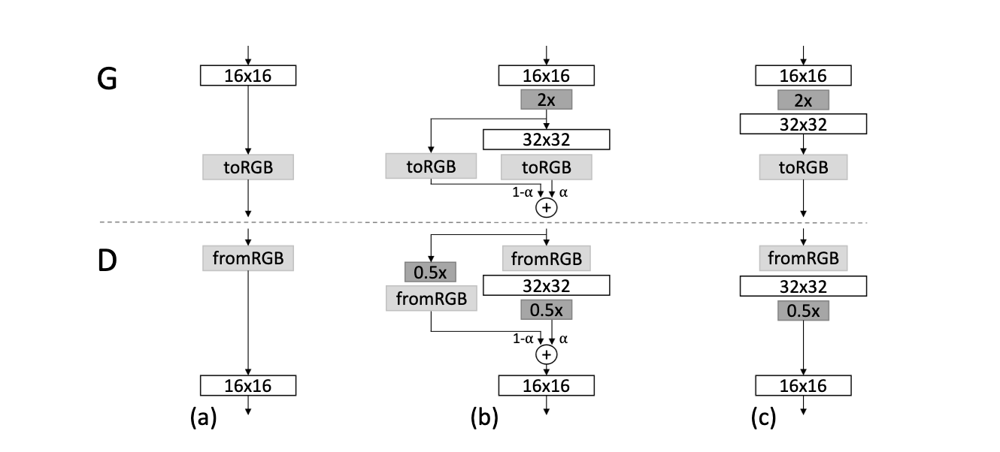

Figure 8 shows both the G and D progressive growing scheme, let's focus on G for now (the idea is the same but the implementation differs, the G case is simpler). (a) represents the base case, we have a layer (16x16 in this case, but it doesn't matter the idea is the same for all layers) which is passed through a to_rgb layer. This is how training proceeds when we are not growing. (b) shows the progressive growing, we add the next 32x32 layer (doubling image resolution) however it is faded in slowly so as not to disrupt previous layers too much. This fading is handled by the $\alpha$ parameter. $\alpha$ grows linearly from 0 -> 1, it acts as a weight which increases the input from the new layer slowly and reduces the input from the 16x16 (previous layer). The input from the previous layer is included as a residual connection (a residual connection is one where the output from an old layer is passed to the output of a subsequent layer, this differs where usually output from previous layers is just passed forward as an input to the next layer). 

We can construct a equation (1) to show this behaviour nicely:


$$\text{out} = ((1-\alpha) * \text{skip}) + (\alpha * \text{outnew})\tag{1}$$


In this case out is the final output, outnew is the output of the new layer and skip is the output of the previous layer. We see then that as $\alpha$ grows it will increase the impact of the new layer and decrease the impact of the previous layer. This is progressive growing!

Let us examine the G_ConvBlock for the full case. The structure G_ConvBlock for the full case matches the Gulrajani case, but the actual layers used are different. We use EqLR Conv layers,  PixelNorm instead of BatchNorm and LeakyReLU instead of ReLU.

We've already discussed the EqLR layers and PixelNorm but why use LeakyReLU over ReLU? The Rectified Linear Unit (ReLU) sets all inputs below 0 to 0. One of the issues of ReLU, is the dying ReLU problem which is when some paramaters always output 0 due to the formulation of the ReLU (observe Figure 9). LeakyReLU applies a constant to the negative values of it's inputs, so unlike ReLU it does not output 0 for negative values, this is an attempt to allow those paramaters to learn rather than shutting them down[<sup>15</sup>](#15).

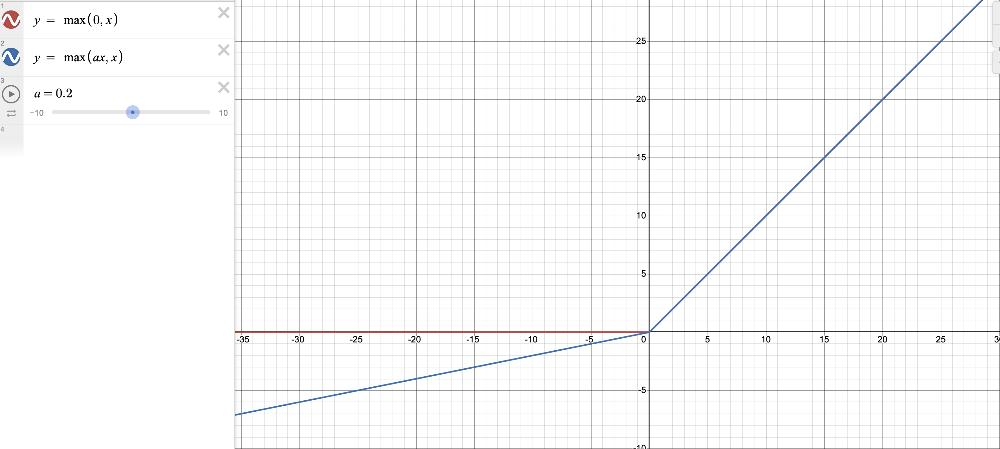

In [14]:
class G_ConvBlock(nn.Module):
    def __init__(
        self, 
        in_c, 
        out_c, 
        ksize1, 
        padding,
        ksize2=None, 
        padding2=None,
        stride=None, 
        upsample=True,
    ):
        super().__init__()
        
        layers_list = []
        
        if ksize2 is None:
            ksize2 = ksize1
            
        if padding2 is None:
            padding2 = padding
        
        # If upsample True, we add the upsample layer before the
        # next set of convolutional blocks
        if upsample:
            layers_list.extend([
                # Upscale, we use the nearest neighbour upsampling technique
                nn.Upsample(scale_factor=2, mode='nearest'),
            ])
        
        # The layers of the block are the same, regardless of if we use upsample or not
        layers_list.extend([
            EqualLRConv2d(in_c, out_c, ksize1, padding=padding),
            PixelNorm(),
            nn.LeakyReLU(0.2),
            EqualLRConv2d(out_c, out_c, ksize2, padding=padding2),
            PixelNorm(),
            nn.LeakyReLU(0.2),
        ])
        
        self.layers = nn.ModuleList(layers_list)
        
    def forward(self, x):
        for layer in self.layers:
            x = layer(x)
        return x

Now we have implemented our G with EqLR, PixelNorm and Progressive growing, let's test it out!

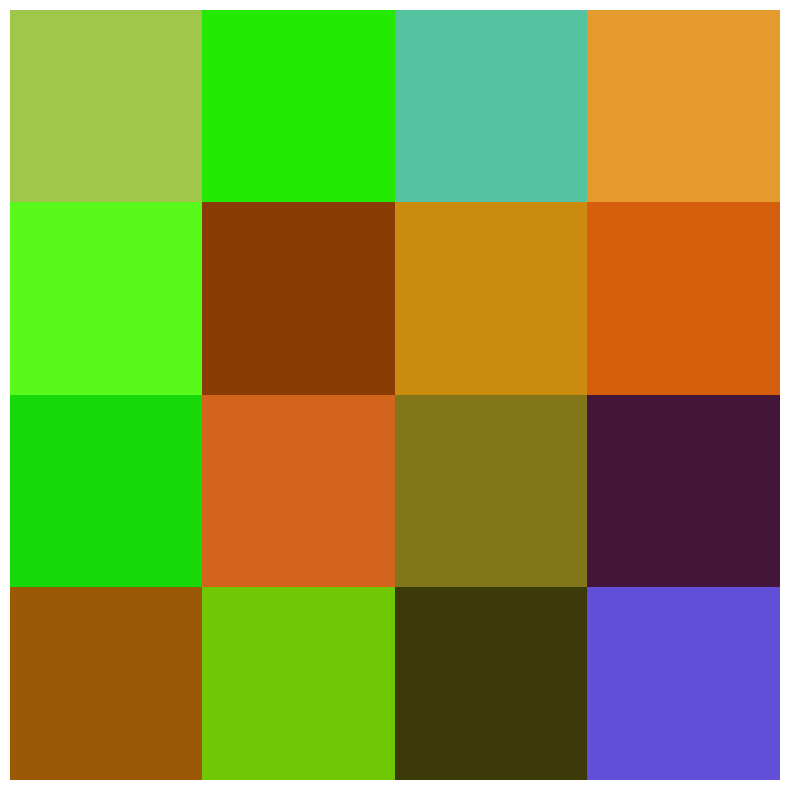

(None, torch.Size([1, 3, 4, 4]))

In [16]:
# TESTING G
g_in = torch.randn((1, 256, 1, 1), device=device)
# Change layer_num and see what happens
g_out = g(g_in, alpha=0.5, layer_num=1)
show_images(g_out), g_out.shape

<h4> The Full Case D </h4>

Its time for the D model. It's seeminly quite similar to the G model but there are a few major differences in it's setup. Let's explore them!

To better understand how our D is setup, take a look at Figure 10.

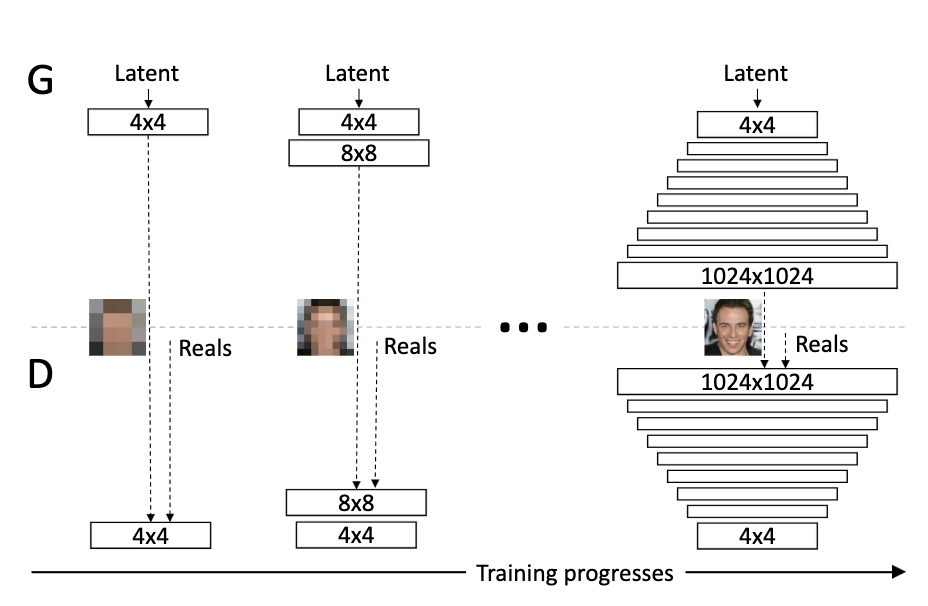

The <b>key</b> thing to note here is the <b>direction of growth</b>. The G model grows from top down to bottom as in, 4x4 -> 8x8 -> 16x16 -> 32x32 -> ... -> 256x256 (it's 1024x1024 in Figure 10 but we stop at 256). Then the output of the G model is fed into the D model, so by necessity the D model grows from bottom up to top as in 256x256 -> 128x128 -> ... -> 32x32 -> 16x16 -> 8x8 -> 4x4. This is what causes the implementation of the G and D models to differ. I had missed this key difference when I first tried to implement the model but studying Figure 10 highlighted the correct pattern.

In [18]:
class Discriminator(nn.Module):
    def __init__(self, out_c=256):
        super().__init__()
        
        # So in that light, we init a ModuleList with the first
        # convblock having expecting the same number of channels as 
        # the last G output. The first from_rgb will provide us with
        # 64 channels.
        # Also, the last block in this ModuleList will be where we start
        # from. I include some numbers on the right to show the order
        # of growth in the D model (these are index numbers, this makes it easier
        # to understand the forward pass)
        self.blocks = nn.ModuleList([
            D_ConvBlock(out_c//4, out_c//4, 3, 1),  # 6 we finish here            
            D_ConvBlock(out_c//4, out_c//2, 3, 1),  # 5
            D_ConvBlock(out_c//2, out_c, 3, 1),  # 4
            D_ConvBlock(out_c, out_c, 3, 1),  # 3
            D_ConvBlock(out_c, out_c, 3, 1),  # 2
            D_ConvBlock(out_c, out_c, 3, 1),  # 1
            D_ConvBlock(out_c+1, out_c, 3, 1, 4, 0, mbatch=True),  # 0 we start here
        ])
        
        # from_rgb takes the RGB image outputted by the G and outputs the
        # number of channels needed for each layer
        self.from_rgb = nn.ModuleList([
            EqualLRConv2d(3, out_c//4, 1),
            EqualLRConv2d(3, out_c//4, 1),
            EqualLRConv2d(3, out_c//2, 1),
            EqualLRConv2d(3, out_c, 1),
            EqualLRConv2d(3, out_c, 1),
            EqualLRConv2d(3, out_c, 1),
            EqualLRConv2d(3, out_c, 1),
        ])
        # The number of layers is needed to implement the growing and skip formula.
        self.num_layers = len(self.blocks)
        
        # The final layer, this is always the final layer it takes the output
        # and converts it to a prediction
        self.linear = EqualLRLinear(out_c, 1)
    
    def forward(self, x, layer_num, alpha):
        # I use a different method of selecting layers here
        # We know at any given point what number of layers we will use
        # so we index over that number
        for i in reversed(range(layer_num)):
            # idx will give us the index into self.blocks, e.g. if we are 
            # at layer 4 idx starts at 7 - 3 - 1 = 3, then 4, 5, and ends at 6
            idx = self.num_layers - i - 1
            # i is an index which start at 0 and the count layer_num starts at 1 hence the +1
            # since i is inverted i+1 == layer_num means we are at the start of our forward loop
            # and as such we need to convert x from RGB. 
            if i+1 == layer_num:
                out = self.from_rgb[idx](x)
            # We always just pass through the blocks, this starts at the top level block
            # for the current number of layers. E.g. at layer_num=4 we start at index 3 of self.blocks
            out = self.blocks[idx](out)
            # i > 0 means we are not on the last block and for all but the last block
            # we must half the resolution
            if i > 0:
                # Half the resolution of the image
                out = F.interpolate(out, scale_factor=0.5, mode='bilinear')
                
                # as before i+1 == layer_num means we are the start of the forward pass
                # and 0 <= alpha < 1 means we are introducing a new layer
                if i+1 == layer_num and 0 <= alpha < 1:
                    # If you refer back to Figure 8 and observe how the growing works for
                    # the D model, the skip connection involves the input x
                    skip = F.interpolate(x, scale_factor=0.5, mode='bilinear')
                    skip = self.from_rgb[idx + 1](skip)
                    out = ((1 - alpha) * skip) + (alpha * out)
        
        # We flatten the output to be passed through the linear layer
        out = out.view(out.size(0), -1)
        out = self.linear(out)
        
        return out

d = Discriminator().to(device)

So, thats our D model code. Once again the init method differs slightly from the Gulrajani case, we make use of Modulelists and create multiple from_rgb's thats it really. The forward method, however is vastly different. As discussed above, the model begins from the bottom and grows bottom up we intialise our model layers as such. Refer to the comments in the forward pass and I explain the full implementation and all the weird indexing going on here :)

A quick explainer on the alpha and progressive growing for the D model. Whereas with the G model it works on the output of layers, in the D model it works on the input to layers. Look at Figure 8, if we are at the 32x32 layer the next layer below is the 16x16 layer, the 32x32 layer being the newly introduced layer. So the alpha fading provides the original input to the previous layer and the new one.

Moving on, let's look at the D_ConvBlock. It is exactly the same as the Gulrajani block, except we include the MiniBatch Standard deviation layer. This addition adds an extra feature map to our final block, hence the out_c+1 in the last conv block above.

In [17]:
class D_ConvBlock(nn.Module):
    def __init__(
        self,
        in_c,
        out_c,
        ksize1, 
        padding, 
        ksize2=None, 
        padding2=None,
        stride=None,   
        mbatch=None,
    ):
        super().__init__()
        
        layers_list = []
        
        if ksize2 is None:
            ksize2 = ksize1
        if padding2 is None:
            padding2 = padding
        
        if mbatch:
            layers_list.extend([
                MiniBatchStdDev(),
            ])
            
        layers_list.extend([
            EqualLRConv2d(in_c, out_c, ksize1, padding=padding),
            nn.LeakyReLU(0.2),
            EqualLRConv2d(out_c, out_c, ksize2, padding=padding2),
            nn.LeakyReLU(0.2),
        ])
        
        self.layers = nn.ModuleList(layers_list)
    
    def forward(self, x):
        for layer in self.layers:
            x = layer(x)
        return x

Awesome! We've now implemented the Full case G and D, only thing remains to train our full Progressive GAN model!!!

(Just after testing the D model)

In [19]:
# Note, if you change the layer_num here you will need to change the 
# dims in the d_in, the number of pixels in must match the layer_num
# e.g. at layer_num = 5 you need 64x64 images. I leave the rest to you to play with ;)
d_in = torch.randn((1, 3, 256, 256), device=device)
d_out = d(d_in, alpha=0.5, layer_num=7)
d_out, d_out.shape

(tensor([[-0.1543]], device='cuda:0', grad_fn=<AddmmBackward0>),
 torch.Size([1, 1]))

<h2>Training the Progressive GAN</h2>

We are nearing the end of our journey, I appreciate this is a long post but we're almost there!

The training loop is quite perculiar for this model, but we'll go through it together. There is one last piece of the puzzle we must put in place before the training loop. In the paper, it is stated that an Exponential Moving Average (EMA) is used for the weights when we show the generated images. That is it is only used at inference time (when we want to generate an image) rather than for the training process. The idea being that by using an EMA we stabilise the weights by using the entire set of weights over the training process[<sup>16</sup>](#16), to illustrate it's effectiveness in our training loop when we sample images we will show both the ones with EMA and without.

In [20]:
# We init a function to calculate the EMA for our parameters.
# This is implemented using two model, one the training G and the other
# a G we do not train but only use to hold the weights after perfoming the EMA
def EMA(model1, model2, decay=0.999):
    par1 = dict(model1.named_parameters())
    par2 = dict(model2.named_parameters())

    for k in par1.keys():
        par1[k].data.mul_(decay).add_(1 - decay, par2[k].data)

In [21]:
# First off let's load our data again
# The scheme is a little different as due to progressive growing
# Our real images will need to be resized depending upon which layer
# we're currently at

def get_dataloader(image_size, batch_size=4):
    transform = transforms.Compose([
        transforms.Resize((image_size, image_size)),  # Resize images to the required size
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ])

    dataset = ImageFolder(root='./celeba_hq_256', transform=transform)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=4, drop_last=True)

    return dataloader

The training proces for the PGGAN has two phases, it is related to the growing and the $\alpha$. So in the first phase we introduce the new layer and $\alpha$ grows from 0 -> 1, increasing linearly after each iteration. Then in the second phase when $\alpha=1$, we continue training the network with the output being fully from the new layer. Recall, equation (1) for the effect $\alpha$ has on the layers when $\alpha=1$ the effect of the skip connection is 0. The purpose of this scheme is to stabilise the network after having added a new layer. This continues until the model is fully trained.

To realise this two phase process, I just run the training loop twice per layer training. Also, having covered the Gulrajani case you will see the training loop is almost identical. The differences come from introducing layer_nums, alpha and the two loops to introduce and stabilise the new layers. As such, I reduce the exposition here and advise you to refer to the Gulrajani case.

Training resolution: 4x4


  0%|          | 0/50000 [00:00<?, ?it/s]

Images after introducing layer: 1
G images


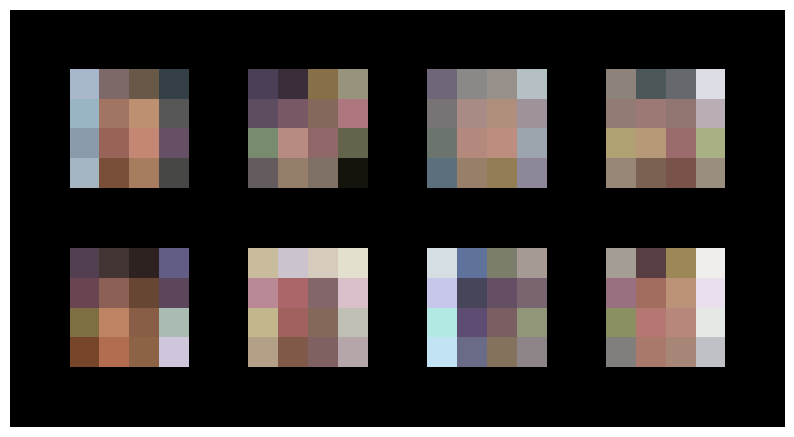

G_running images


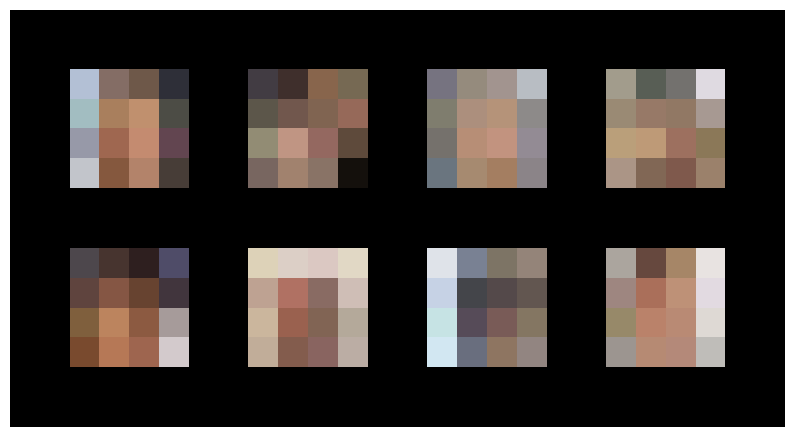

  0%|          | 0/50000 [00:00<?, ?it/s]

Images after stabilising layer: 1
G images


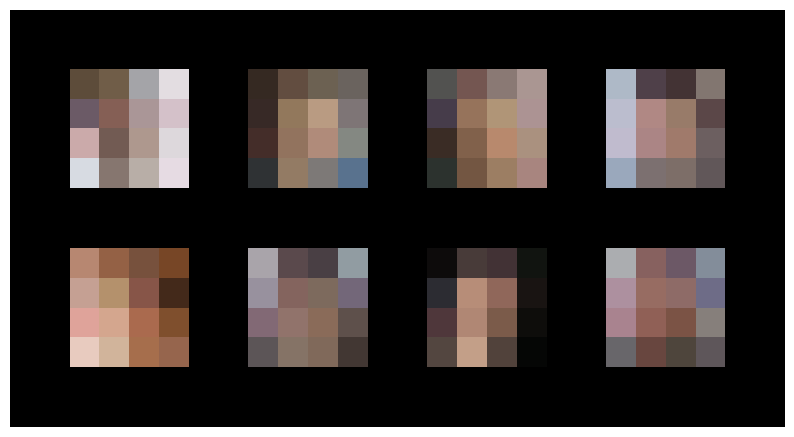

G_running images


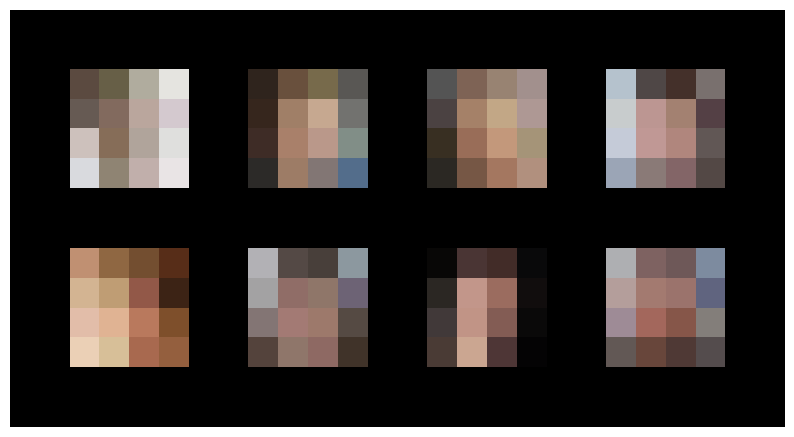

Training resolution: 8x8


  0%|          | 0/50000 [00:00<?, ?it/s]

Images after introducing layer: 2
G images


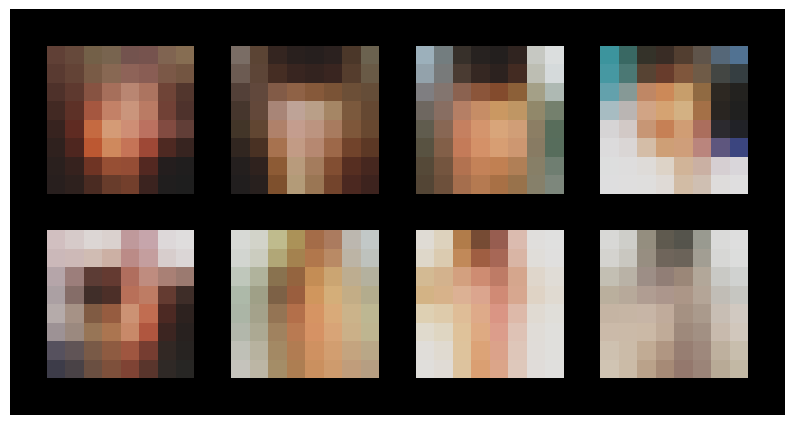

G_running images


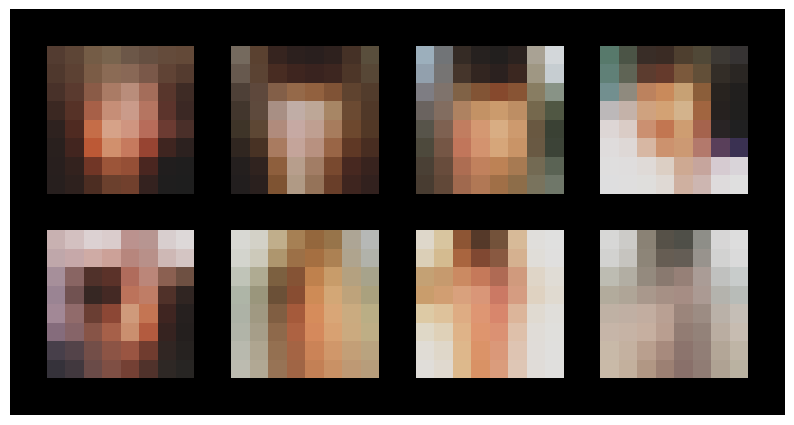

  0%|          | 0/50000 [00:00<?, ?it/s]

Images after stabilising layer: 2
G images


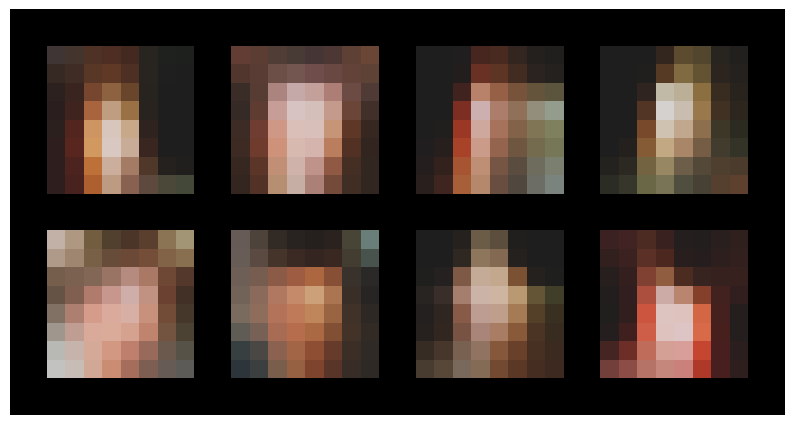

G_running images


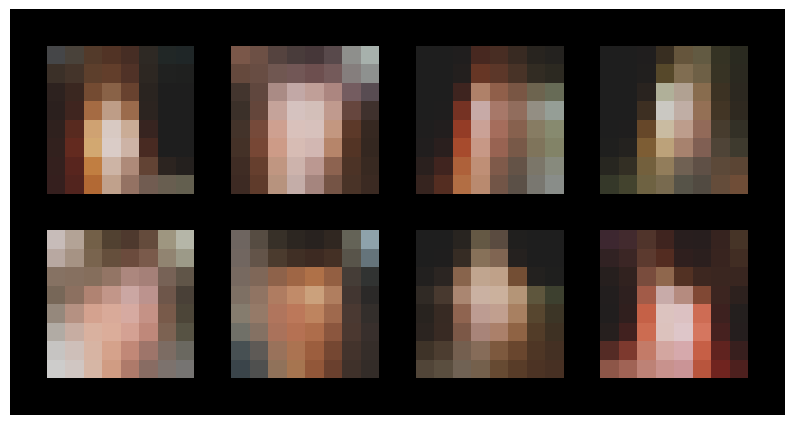

Training resolution: 16x16


  0%|          | 0/50000 [00:00<?, ?it/s]

Images after introducing layer: 3
G images


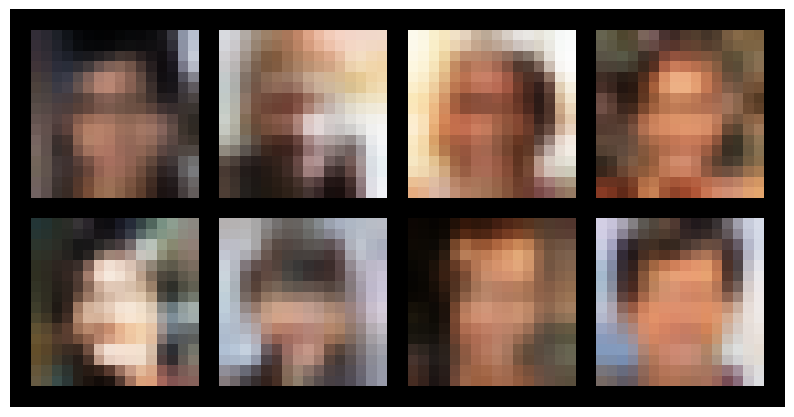

G_running images


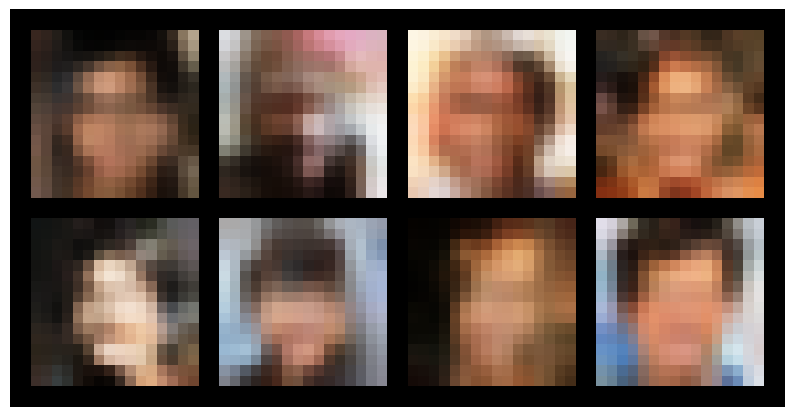

  0%|          | 0/50000 [00:00<?, ?it/s]

Images after stabilising layer: 3
G images


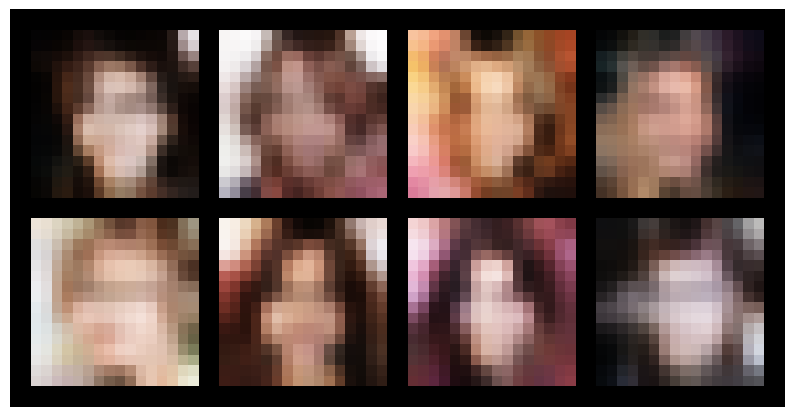

G_running images


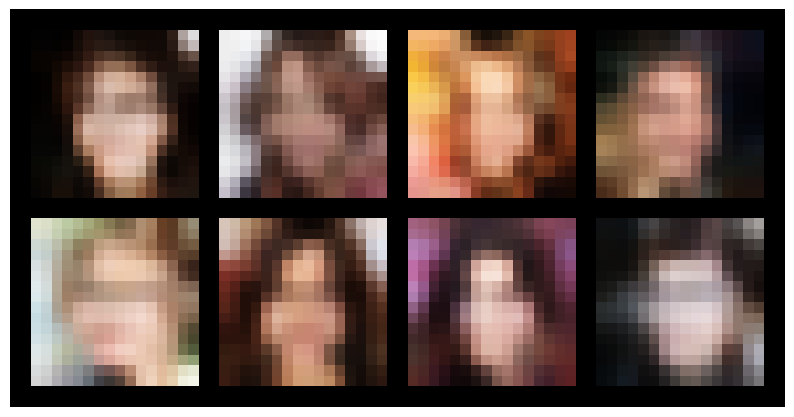

Training resolution: 32x32


  0%|          | 0/50000 [00:00<?, ?it/s]

Images after introducing layer: 4
G images


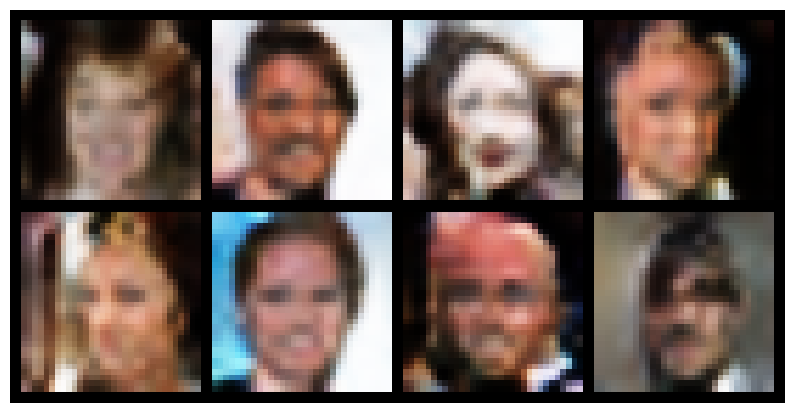

G_running images


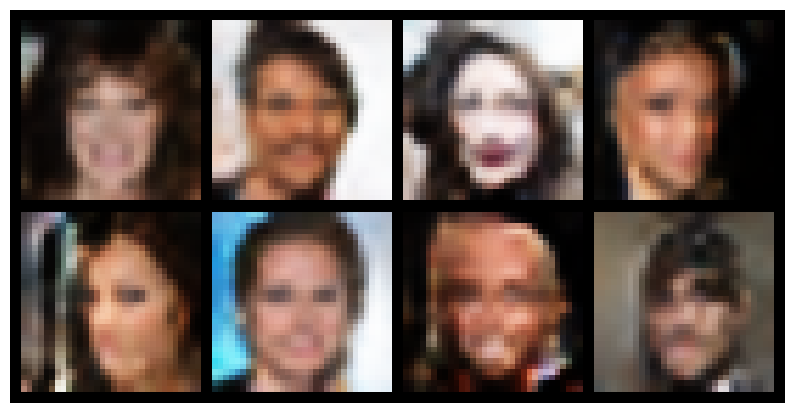

  0%|          | 0/50000 [00:00<?, ?it/s]

Images after stabilising layer: 4
G images


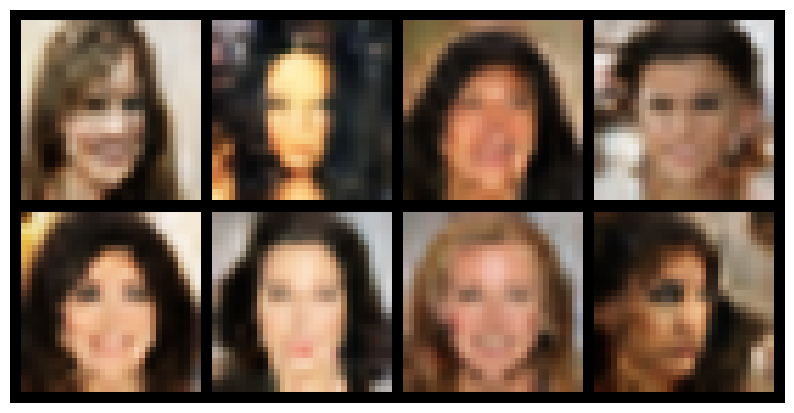

G_running images


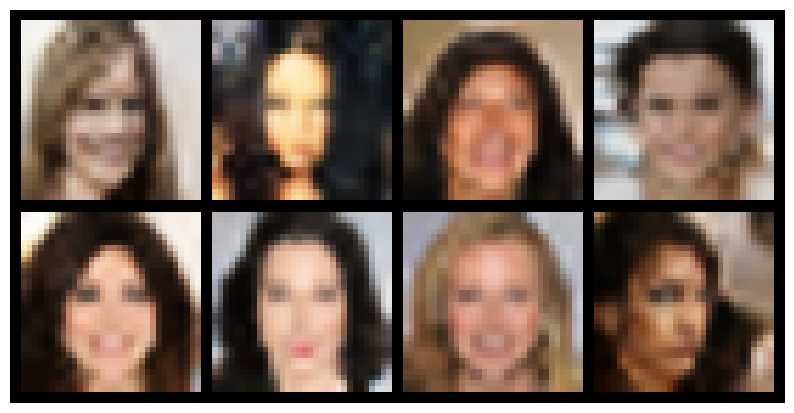

Training resolution: 64x64


  0%|          | 0/50000 [00:00<?, ?it/s]

Images after introducing layer: 5
G images


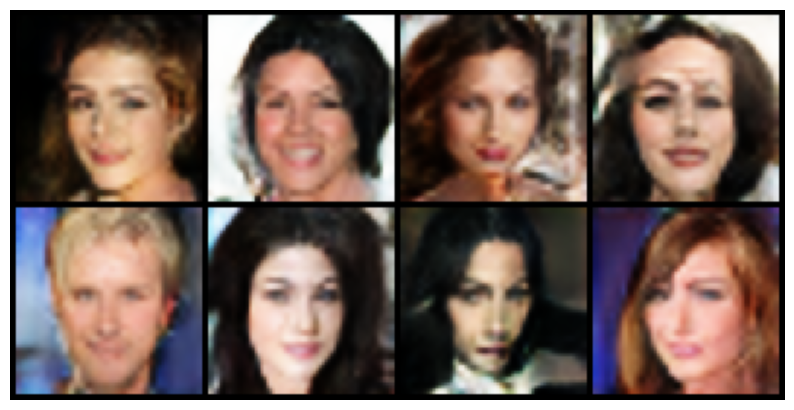

G_running images


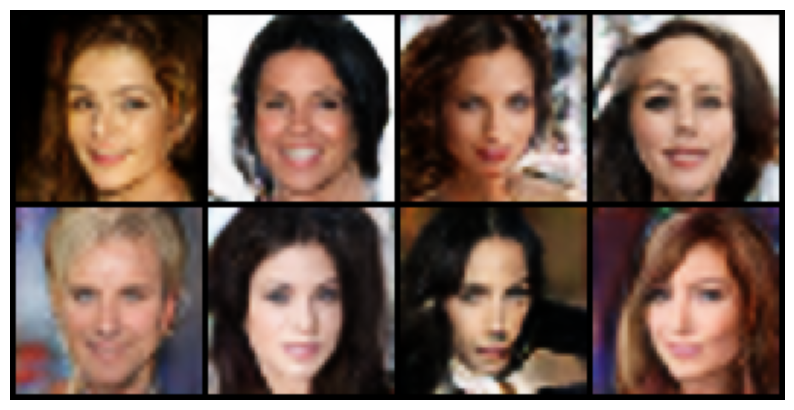

  0%|          | 0/50000 [00:00<?, ?it/s]

Images after stabilising layer: 5
G images


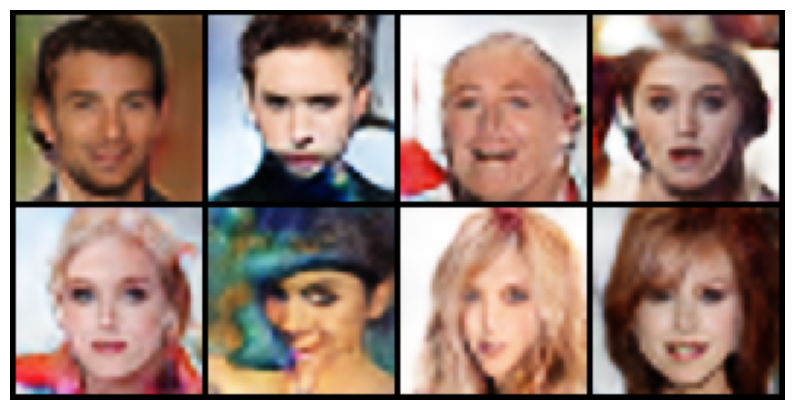

G_running images


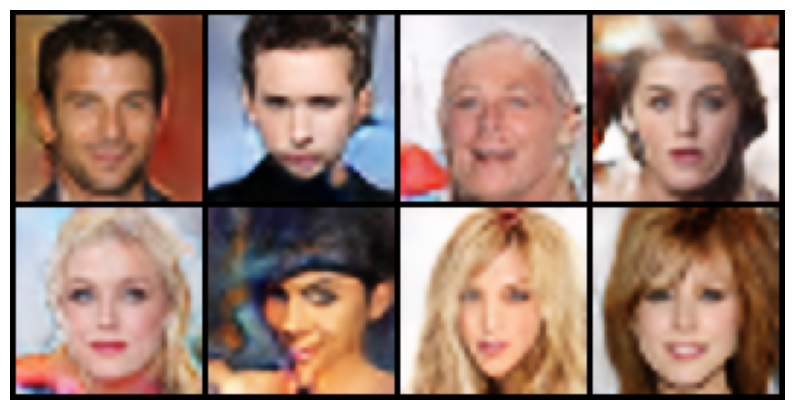

Training resolution: 128x128


  0%|          | 0/50000 [00:00<?, ?it/s]

Images after introducing layer: 6
G images


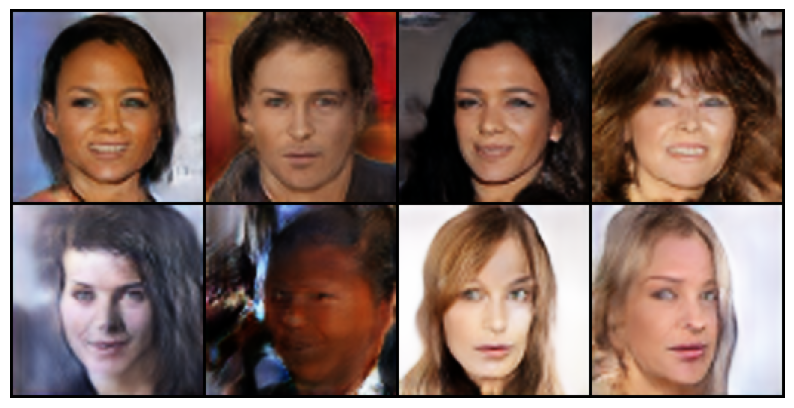

G_running images


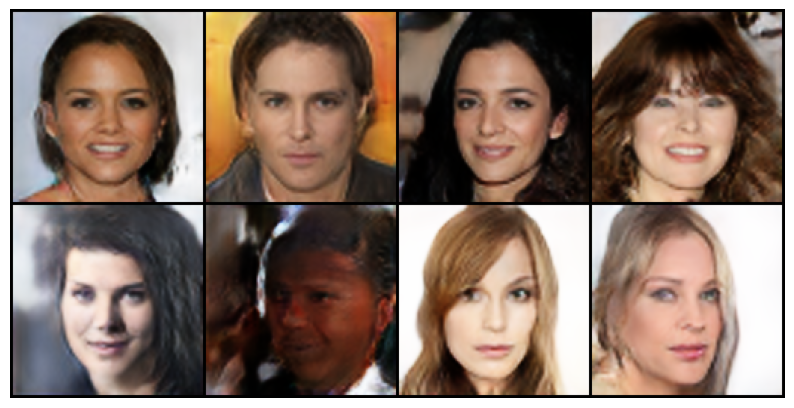

  0%|          | 0/50000 [00:00<?, ?it/s]

Images after stabilising layer: 6
G images


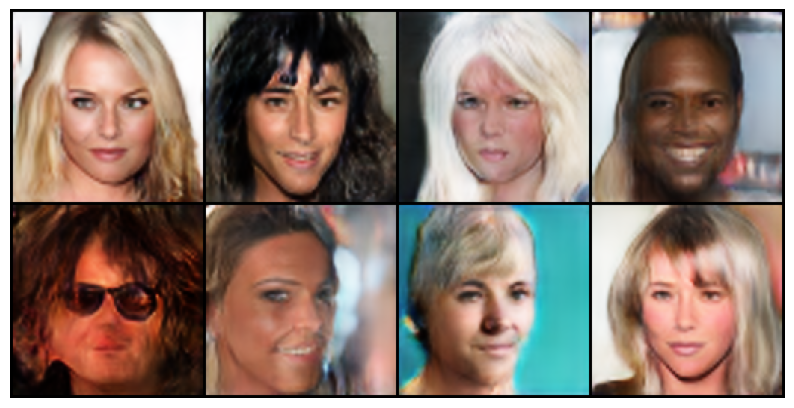

G_running images


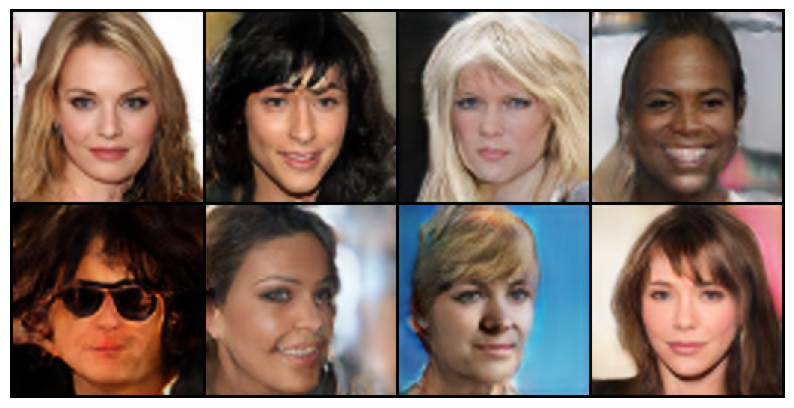

Training resolution: 256x256


  0%|          | 0/50000 [00:00<?, ?it/s]

Images after introducing layer: 7
G images


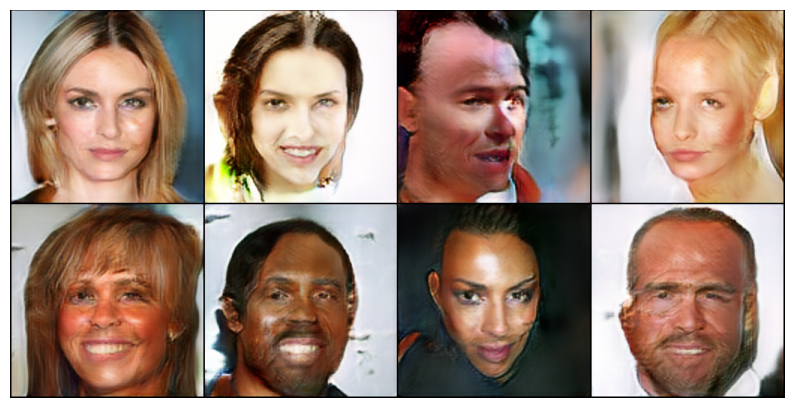

G_running images


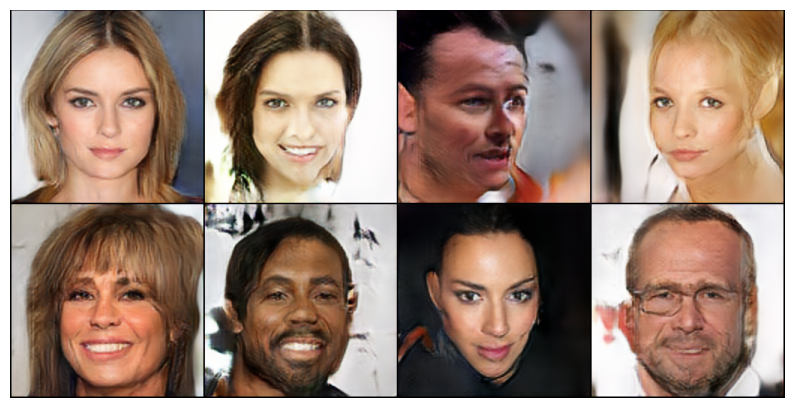

  0%|          | 0/50000 [00:00<?, ?it/s]

Images after stabilising layer: 7
G images


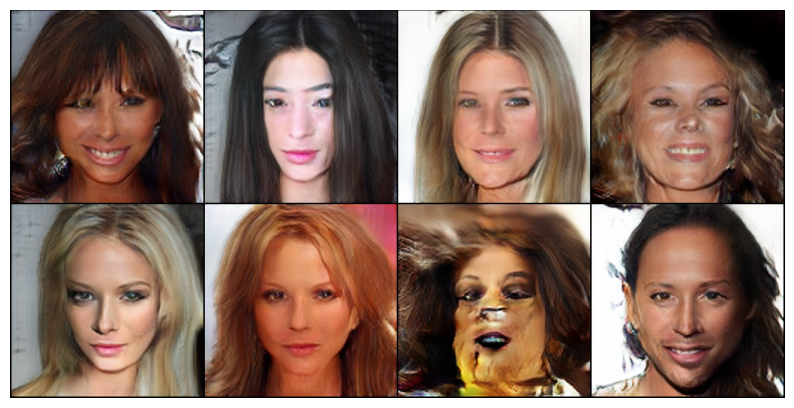

G_running images


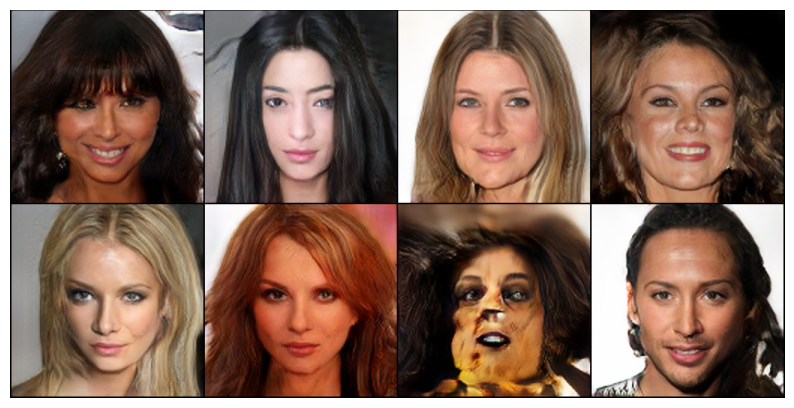

In [53]:
g = Generator().to(device)  # The G we train
d = Discriminator().to(device)
g_running = Generator().to(device)  # The G we maintain for creating samples

g_running.train(False)

# The LR is quite high but this is specified in the paper
# A high LR has the benefit of allowing us to explore more of the gradient space
g_optimizer = torch.optim.Adam(g.parameters(), lr=0.001, betas=(0.0, 0.99))
d_optimizer = torch.optim.Adam(d.parameters(), lr=0.001, betas=(0.0, 0.99))

EMA(g_running, g, 0)

# We use this list to create a dataloader with the correct resolution for imgs
img_size = [4, 8, 16, 32, 64, 128, 256]

layer_num = 1  # We start at layer 1
start_iter = 0  # We start at iteration 0, of course, we use iterations in this training loop not epochs

# The total number of iterations each phase of training will run for
total_iters = 50000  # The paper states 800k per phase but I go for 50k
# I think 800k is excessive, but feel free to increase the number of training iterations and see how it goes!

# Initialize lists to store loss values for statistics
g_losses = []
d_losses = []

# range 1-7, for 7 layers we will introduce
for layer_num in range(1, 8):
    alpha = 0  # Set alpha to 0 before we introduce each new layer
    
    resolution = img_size[layer_num-1]
    data_loader = get_dataloader(resolution)
    dataset = iter(data_loader)
    
    print(f'Training resolution: {resolution}x{resolution}')
    pbar = tqdm(range(total_iters))
    
    for i in pbar:
        d.zero_grad()
        
        try:
            real_imgs, label = next(dataset)
        except (OSError, StopIteration):
            # If we reach the end of the dataset, we reintialise the iterable
            # basically starting again
            dataset = iter(data_loader)
            real_imgs, label = next(dataset)
        
        # Train D
        # real_size keeps track of the batch_size 
        real_size = real_imgs.size(0)
        real_imgs = real_imgs.to(device)
        label = label.to(device)
        real_preds = d(real_imgs, layer_num=layer_num, alpha=alpha)
        # The line below implements a small weight penalty
        # It is stated in the paper and it's reason is to prevent the 
        # D loss being too far away from 0 preventing extreme outputs 
        real_preds = real_preds.mean() - 0.001 * (real_preds**2).mean()
        
        # sample input for G
        z = torch.randn(real_size, 256, 1, 1).to(device)
        
        gen_imgs = g(z, layer_num=layer_num, alpha=alpha)
        
        gen_preds = d(gen_imgs.detach(), layer_num=layer_num, alpha=alpha)
        gen_preds = gen_preds.mean()  # Make gen_preds a signle value
        
        # Gradient Penalty - GP
        eps = torch.rand((real_size, 1, 1, 1)).to(device)
        x_hat = (eps * real_imgs) + ((1-eps) * gen_imgs.detach())
        x_hat.requires_grad_(True)
        pred_x_hat = d(x_hat, layer_num=layer_num, alpha=alpha)

        WGAN = gen_preds.mean() - real_preds.mean()
        grads = torch.autograd.grad(
            outputs=pred_x_hat, inputs=x_hat,
            grad_outputs=torch.ones_like(pred_x_hat),
            create_graph=True, retain_graph=True
        )[0]
        GP = ((grads.norm(2, dim=1) - 1) ** 2).mean() 

        # WGAN_GP_loss = d_loss
        d_loss = WGAN + 10 * GP
        d_loss.backward()
        d_optimizer.step()

        d_losses.append(d_loss.detach())
        
        # Now lets train the Generator
        g.zero_grad()
        z = torch.randn(real_size, 256, 1, 1).to(device)
        gen_imgs = g(z, layer_num=layer_num, alpha=alpha)
        gen_preds = d(gen_imgs, layer_num=layer_num, alpha=alpha)
        g_loss = -gen_preds.mean()
        g_loss.backward()
        g_optimizer.step()

        g_losses.append(g_loss.detach())
        
        EMA(g_running, g)
    
        alpha += 1 / len(pbar)
        alpha = round(alpha, 2)
    
    # I will show images both after we have introduced the new layer
    # and after we have stabilised it
    with torch.no_grad():
        sample_z = torch.randn(8, 256, 1, 1).to(device)
        sample_imgs = g(sample_z, layer_num=layer_num, alpha=alpha)
        sample_imgs_EMA = g_running(sample_z, layer_num=layer_num, alpha=alpha)
        print(f'Images after introducing layer: {layer_num}')
        print('G images')
        show_images(sample_imgs)
        print('G_running images')
        show_images(sample_imgs_EMA)
    
    
    stabilise_pbar = tqdm(range(total_iters))
    # To stabilise we just run the whole thing again, I do it this
    # way for simplicity
    for i in stabilise_pbar:
        d.zero_grad()
        
        try:
            real_imgs, label = next(dataset)
        except (OSError, StopIteration):
            dataset = iter(data_loader)
            real_imgs, label = next(dataset)
        
        # Train D
        # real_size keeps track of the batch_size 
        real_size = real_imgs.size(0)
        real_imgs = real_imgs.to(device)
        label = label.to(device)
        real_preds = d(real_imgs, layer_num=layer_num, alpha=alpha)
        # The line below implements a small weight penalty
        # It is stated in the paper and it's reason is to prevent the 
        # D loss being too far away from 0 preventing extreme outputs 
        real_preds = real_preds.mean() - 0.001 * (real_preds**2).mean()
        
        # sample input for G
        z = torch.randn(real_size, 256, 1, 1).to(device)
        
        gen_imgs = g(z, layer_num=layer_num, alpha=alpha)
        
        gen_preds = d(gen_imgs.detach(), layer_num=layer_num, alpha=alpha)
        gen_preds = gen_preds.mean()  # Make gen_preds a signle value
        
        # Gradient Penalty - GP
        eps = torch.rand((real_size, 1, 1, 1)).to(device)
        x_hat = (eps * real_imgs) + ((1-eps) * gen_imgs.detach())
        x_hat.requires_grad_(True)
        pred_x_hat = d(x_hat, layer_num=layer_num, alpha=alpha)

        WGAN = gen_preds.mean() - real_preds.mean()
        grads = torch.autograd.grad(
            outputs=pred_x_hat, inputs=x_hat,
            grad_outputs=torch.ones_like(pred_x_hat),
            create_graph=True, retain_graph=True
        )[0]
        GP = ((grads.norm(2, dim=1) - 1) ** 2).mean() 

        # WGAN_GP_loss = d_loss
        d_loss = WGAN + 10 * GP
        d_loss.backward()
        d_optimizer.step()

        d_losses.append(d_loss.detach())
        
        # Now lets train the Generator
        g.zero_grad()
        z = torch.randn(real_size, 256, 1, 1).to(device)
        gen_imgs = g(z, layer_num=layer_num, alpha=alpha)
        gen_preds = d(gen_imgs, layer_num=layer_num, alpha=alpha)
        g_loss = -gen_preds.mean()
        g_loss.backward()
        g_optimizer.step()

        g_losses.append(g_loss.detach())
        
        EMA(g_running, g)
    
    with torch.no_grad():
        sample_z = torch.randn(8, 256, 1, 1).to(device)
        sample_imgs = g(sample_z, layer_num=layer_num, alpha=alpha)
        sample_imgs_EMA = g_running(sample_z, layer_num=layer_num, alpha=alpha)
        print(f'Images after stabilising layer: {layer_num}')
        print('G images')
        show_images(sample_imgs)
        print('G_running images')
        show_images(sample_imgs_EMA)
    
    

There we have it, you've implemented the PGGAN let's give ourselves a pat on the back!

Look at those amazing generated faces. I'm sure you see some artifacting or issues but they look pretty good dont they? Comparing them to the Gulrajani case, I hope you can see that the progressive growing has it's benefits (look at the loss plots below for hard proof), the backgrounds are much better handled and the faces look alot more realistic (to me at least). Also, we have seemingly dealt with the low variance of outputs issue. If you want to dig deeper on this, remove the MiniBatch StdDev layer and see how it affects the full case PGGAN this is one way to check if it actually does increase the variance of outputs.

Also, take note of the G vs G_running images. First you see they are pretty similar, which is because GANs are deterministic meaning if you provide them the same input twice the output will be the same. This tells us the EMA doesn't change the parameters of the GAN by large amount, but it does imrpove the outputs. For example, in the last output on the top right, the G image has some artifacting and distortion but the G_runnung does not.

Firstly, in the paper they use differing batch sizes depending on the resolution being generated due to memory constrains, I throw this out in favour of a small batch size. The poinf of throwing it out is for simplicity. 

Secondly, the training process for PGGAN is quite alot quicker than the Gulrajani case and is much more stable. This is an inherent benefit of the PGGAN, the stability comes from the growing. In the early stages there is less information for the network to learn and as such it does a better job of learning the information necessary to create low resolution images. This makes the overall task simpler, we are learning the features in steps rather than asking the network to discover a mapping from 4x4 -> 256x256 in one step. Regarding the speed, the improvement comes from the fact that alot of computation happens at lower resolutions, simply less numbers = faster computation (you can observe this in the progress bar, the it/s decreases as we add more layers and increase the resolution).

The fact that the full case learns better is due to this introduction of steps, without the growing each layer in the Gulrajani GAN is tasked with simultaneously finding successive representations for both large scale (at low resolutions) and small scale (at high resolutions) details. Growing allows earlier layers to converge early on and reach an optimal point, i.e. a good foundation for successive layers to build upon.

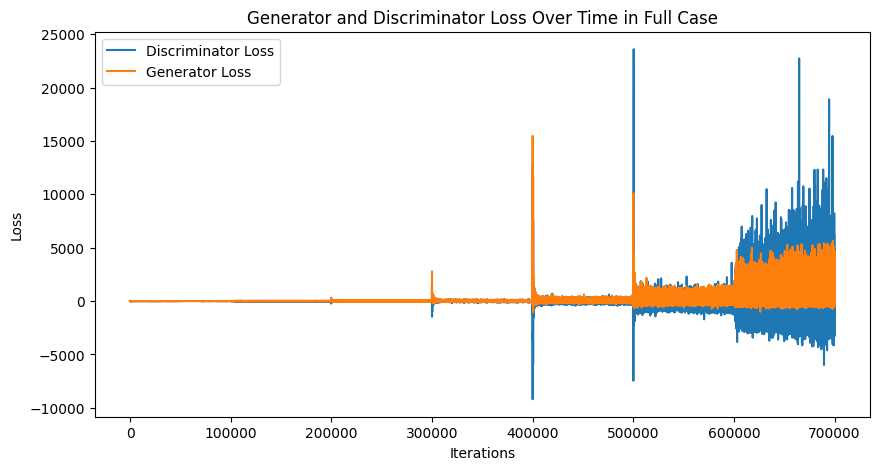

In [54]:
# Assuming d_losses and g_losses are lists of GPU tensors
d_losses_cpu = [loss.cpu().detach().numpy() for loss in d_losses]
g_losses_cpu = [loss.cpu().detach().numpy() for loss in g_losses]

plt.figure(figsize=(10, 5))
plt.plot(d_losses_cpu, label='Discriminator Loss')
plt.plot(g_losses_cpu, label='Generator Loss')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.legend()
plt.title('Generator and Discriminator Loss Over Time in Full Case')
plt.show()

The loss plot for our G and D models is pretty crazy, we get some pretty extreme values. I think this is why the paper uses metrics such as Sliced Wasserstein distance or MS-SSIM. They probably provide a much more meaningful signal than the loss does. I have skipped including these but I would recommend you read the paper and try implement them yourselves. Despite this, you can see a difference in this plot vs the Gulrajani case plot. Mainly, the plot is much more stable at the start of training for about 400000 iterations the loss remains stable. Note, how you see jumps in the loss at certain intervals this is when a new layer is introduced. 

The stability exhibited by the model in the earlier layers is one the key factors of allowing the PGGAN to be successful. Further, despite the crazy loss values the images do look quite good but I suspect our D model is pretty good too hence the high values (the G is failing to fool the D).

Now then, we've implemented two versions of a PGGAN and explored how the techniques in the full case improve the training process and the outputs themselves! I hope you can see we get some pretty good looking outputs, perhaps if you train the models for longer you can improve the quality even further. Another thing you may want to try, is to increase the resolution we grow to (e.g. 512x512 images). The PGGAN was a big thing in it's time, one of the first GANs to generate somewhat high resolution images.

***

<a id="1" style="text-decoration: none; color: inherit;"><sup>1</sup></a> Add image here from goodfellow GAN

<a id="2" style="text-decoration: none; color: inherit;"><sup>2</sup></a> I abbreviate Generative Adversarial Network to GAN and this refers to the one proposed by <a href="https://arxiv.org/abs/1406.2661">Goodfellow, et al</a>

<a id="3" style="text-decoration: none; color: inherit;"><sup>3</sup><a href="https://www.cs.toronto.edu/~kriz/learning-features-2009-TR.pdf"> Learning Multiple Layers of Features from Tiny Images</a>
    
<a id="4" style="text-decoration: none; color: inherit;"><sup>4</sup></a> This name comes from the fact the training regime follows the paper by <a href="https://arxiv.org/abs/1704.00028">Gulrajani et al. (2017) </a> 
    
<a id="5" style="text-decoration: none; color: inherit;"><sup>5</sup></a> I found that when updating the D model more frequently than the G model (this parameter is called $n_{critic}$, the training was a lot less stable as the D model became too strong in the game.
    
<a id="6" style="text-decoration: none; color: inherit;"><sup>6</sup></a> Here's a useful resource to build your understanding of PyTorch and what I've done here and other useful tricks: <a href="https://github.com/FrancescoSaverioZuppichini/Pytorch-how-and-when-to-use-Module-Sequential-ModuleList-and-ModuleDict">https://github.com/FrancescoSaverioZuppichini/Pytorch-how-and-when-to-use-Module-Sequential-ModuleList-and-ModuleDict</a>
    
<a id="7" style="text-decoration: none; color: inherit;"><sup>7</sup></a> I want to give credit to the repo I used to build out my training loop, I admit I had a lot of trouble setting this up but this is okay. Remeber to never give up and don't be afraid to ask for help :) <a href="https://github.com/odegeasslbc/Progressive-GAN-pytorch/tree/master">https://github.com/odegeasslbc/Progressive-GAN-pytorch/tree/master</a>
    
<a id="8" style="text-decoration: none; color: inherit;"><sup>8</sup> </a><a href="https://arxiv.org/pdf/1701.07875">Wasserstein GAN Paper, Martin Arjovsky, et al.</a> Note, in this paper and in other WGAN related materials the discriminator model is called the critic but they mean the same thing.

<a id="9" style="text-decoration: none; color: inherit;"><sup>9</sup> </a>If there is anything unclear here, or you think I made a mistake please feel free to reach out to me. I'd be happy to discuss WGAN or any apsects of the paper! @ <a href='m&#97;&#105;&#108;&#116;o&#58;y%7&#53;s&#117;&#102;&#109;oh&#97;mm&#97;%&#54;4&#64;l%&#54;9ve&#46;&#99;&#111;m'>y&#117;&#115;u&#102;mo&#104;&#97;m&#109;ad&#64;l&#105;ve&#46;co&#109;</a>
    
<a id="10" style="text-decoration: none; color: inherit;"><sup>10</sup></a> A k-Lipschitz constraint requires that the norms of the gradients of a function F (in our case the D model, remember a neural network is just a fancy function) have value 1 almost everywhere.
    
<a id="11" style="text-decoration: none; color: inherit;"><sup>11</sup></a> The WGAN-GP paper states layer norm is a good drop in for BN which is exactly what we did in the Gulrajani case.
    
<a id="12" style="text-decoration: none; color: inherit;"><sup>12</sup></a> You can find the authors implemenation here: <a href="https://github.com/tkarras/progressive_growing_of_gans/blob/master/networks.py">https://github.com/tkarras/progressive_growing_of_gans/blob/master/networks.py</a>
    
<a id="13" style="text-decoration: none; color: inherit;"><sup>13</sup></a> This is kind of a cheat on my part, but I was stumped for about 3 weeks trying to implement my PGGAN until I found that repo. I think this sort of thing is okay in the journey to learning and it's okay to get stuck on things which are hard. We are taking this journey of learning together and we cannot make it the whole way alone. To that end, here's my email <a href='m&#97;&#105;&#108;&#116;o&#58;y%7&#53;s&#117;&#102;&#109;oh&#97;mm&#97;%&#54;4&#64;l%&#54;9ve&#46;&#99;&#111;m'>y&#117;&#115;u&#102;mo&#104;&#97;m&#109;ad&#64;l&#105;ve&#46;co&#109;</a>. Feel free to reach out!
    
<a id="14" style="text-decoration: none; color: inherit;"><sup>14</sup></a> So I actually observed this in practise, I made an error in my PixelNorm and had switched the / for a *. This resulted in the norms of the network exploding, the weights dynamic range exploded too and training failed.
    
<a id="15" style="text-decoration: none; color: inherit;"><sup>15</sup></a> This is to the best of my knowledge, feel free to correct me here. Another reason for the use of Leaky ReLU maybe to reduce sparsity as mentioned in hack 5 @ <a href="https://github.com/soumith/ganhacks">https://github.com/soumith/ganhacks</a>
  
<a id="16" style="text-decoration: none; color: inherit;"><sup>16</sup></a> <a href="https://leimao.github.io/blog/Exponential-Moving-Average/">https://leimao.github.io/blog/Exponential-Moving-Average/</a>
    
<a id="17" style="text-decoration: none; color: inherit;"><sup>17</sup></a> You can find out more about gradient based learning in this great video by Andrej Karpathy <a href="https://www.youtube.com/watch?v=VMj-3S1tku0">https://www.youtube.com/watch?v=VMj-3S1tku0</a>